Tarea 2: Aumentar la cantidad de espectros (>1000) de WDA (+ WDB, para tener más, pero prioridad solo una clase) y aplicar PCA, t-SNE y Kernel PCA a esa clase, luego aplicar algoritmos de clustering (3)

Antes de aplicar algoritmos de clustering, se reduce dimensionalidad por la MALDICIÓN DE LA DIMENSIONALIDAD

In [ ]:
project_dir = Path().resolve().parent

model_path = os.path.join(project_dir, r"models\model_4C_3FC.h5")
data_path = os.path.join(project_dir, r"data\raw\sdss_dat_files")
labels_path = os.path.join(project_dir, r"data\raw\label_data")

NameError: name 'Path' is not defined

In [ ]:
def process_spectrum(file_path):
    try:
        sed = np.loadtxt(file_path, unpack=True)
        flux = sed[1, 48:-400]   # queda en 4200

        # ajuste a 3750 (como espera la red)
        if len(flux) > 3750:
            diff = len(flux) - 3750
            start = diff // 2
            flux = flux[start:start + 3750]
        elif len(flux) < 3750:
            flux = np.pad(flux, (0, 3750 - len(flux)), mode='constant')

        norm_val = flux[2100]
        if norm_val == 0 or np.isnan(norm_val):
            norm_val = np.mean(flux)

        if norm_val == 0 or np.isnan(norm_val):
            return None

        flux = flux / norm_val

        if np.isnan(flux).any():
            return None

        return flux.astype(np.float32)

    except Exception:
        return None

In [ ]:
fields = ['File Name', 'MJD', 'Target ID', 'DB ID', 'Classification', 'Data Quality']
raw_labels_df = pd.DataFrame()

for filename in os.listdir(labels_path):
    if filename.endswith('.csv'):
        file_path = os.path.join(labels_path, filename)
        df = pd.read_csv(file_path, usecols=fields)
        raw_labels_df = pd.concat([raw_labels_df, df], ignore_index=True)

classes_of_interest = ['WDA', 'WDB']
star_df = raw_labels_df[raw_labels_df['Classification'].isin(classes_of_interest)].copy()

print(star_df['Classification'].value_counts())

Classification
WDA    13748
WDB     1186
Name: count, dtype: int64


In [ ]:
file_dict = {}

for folder in os.listdir(data_path):
    folder_full_path = os.path.join(data_path, folder)
    if os.path.isdir(folder_full_path):
        for filename in os.listdir(folder_full_path):
            if filename.endswith('.dat'):
                key = filename.split('-')[-2] + '_' + filename.split('_')[-1]
                file_dict[key] = os.path.join(folder, filename)

spectrum_list = []
for _, row in star_df.iterrows():
    filekey = str(row['MJD']) + '_' + str(row['Target ID']) + '.dat'
    if filekey in file_dict:
        spectrum_list.append({
            'filename': file_dict[filekey],
            'classID': row['Classification']
        })

spectrum_df = pd.DataFrame(spectrum_list)
print(spectrum_df['classID'].value_counts())
print(spectrum_df.shape)

classID
WDA    13723
WDB     1184
Name: count, dtype: int64
(14907, 2)


In [ ]:
rng = np.random.default_rng(42)

n_per_class = 1100

wda_df = spectrum_df[spectrum_df['classID'] == 'WDA'].copy()
wdb_df = spectrum_df[spectrum_df['classID'] == 'WDB'].copy()

print("Disponibles:")
print("WDA:", len(wda_df))
print("WDB:", len(wdb_df))

if len(wda_df) < n_per_class or len(wdb_df) < n_per_class:
    raise ValueError("No hay suficientes espectros para tomar 1100 por clase.")

wda_sample = wda_df.sample(n=n_per_class, random_state=42)
wdb_sample = wdb_df.sample(n=n_per_class, random_state=42)

selected_df = pd.concat([wda_sample, wdb_sample], ignore_index=True)
selected_df = selected_df.sample(frac=1, random_state=42).reset_index(drop=True)

print(selected_df['classID'].value_counts())

Disponibles:
WDA: 13723
WDB: 1184
classID
WDB    1100
WDA    1100
Name: count, dtype: int64


In [ ]:
X_list = []
y_labels = []
valid_rows = []

for _, row in selected_df.iterrows():
    f_path = os.path.join(data_path, row['filename'])
    spec = process_spectrum(f_path)
    if spec is not None:
        X_list.append(spec)
        y_labels.append(row['classID'])
        valid_rows.append(row)

X_final = np.array(X_list, dtype=np.float32)
X_input = X_final.reshape((X_final.shape[0], X_final.shape[1], 1))
y_labels = np.array(y_labels)

selected_valid_df = pd.DataFrame(valid_rows).reset_index(drop=True)

print("X_input:", X_input.shape)
print(pd.Series(y_labels).value_counts())

X_input: (2199, 3750, 1)
WDA    1100
WDB    1099
Name: count, dtype: int64


In [ ]:
full_model = load_model(model_path)

dummy_input = np.zeros((1, 3750, 1), dtype=np.float32)
_ = full_model.predict(dummy_input, verbose=0)

full_model.summary()

C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\.venv\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\.venv\lib\site-packages\keras\src\optimizers\base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 1874, 128)           │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 937, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_1 (Conv1D)                    │ (None, 467, 64)             │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 233, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_2 (Conv1D)                    │ (None, 115, 32)             │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 57, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_3 (Conv1D)                    │ (None, 27, 16)              │           2,064 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 13, 16)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 208)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          26,752 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 81,246 (317.37 KB)

 Trainable params: 81,244 (317.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [ ]:
def build_extractor_until(layer_name, full_model):
    input_layer = layers.Input(shape=(3750, 1))
    x = input_layer

    for layer in full_model.layers:
        x = layer(x)
        if layer.name == layer_name:
            break

    extractor = Model(inputs=input_layer, outputs=x)
    return extractor

In [ ]:
flatten_extractor = build_extractor_until("flatten", full_model)
dense_extractor = build_extractor_until("dense", full_model)
dense1_extractor = build_extractor_until("dense_1", full_model)
dense2_extractor = build_extractor_until("dense_2", full_model)

In [ ]:
flatten_features = flatten_extractor.predict(X_input, batch_size=64, verbose=1)
dense_features = dense_extractor.predict(X_input, batch_size=64, verbose=1)
dense1_features = dense1_extractor.predict(X_input, batch_size=64, verbose=1)
dense2_features = dense2_extractor.predict(X_input, batch_size=64, verbose=1)

print("flatten:", flatten_features.shape)   # esperado: (N, 208)
print("dense:", dense_features.shape)       # esperado: (N, 128)
print("dense_1:", dense1_features.shape)    # esperado: (N, 64)
print("dense_2:", dense2_features.shape)    # esperado: (N, 32)

35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
flatten: (2199, 208)
dense: (2199, 128)
dense_1: (2199, 64)
dense_2: (2199, 32)


In [ ]:
pca_flatten_32 = PCA(n_components=32, random_state=42)
flatten_32 = pca_flatten_32.fit_transform(flatten_features)

pca_dense_32 = PCA(n_components=32, random_state=42)
dense_32 = pca_dense_32.fit_transform(dense_features)

pca_dense1_32 = PCA(n_components=32, random_state=42)
dense1_32 = pca_dense1_32.fit_transform(dense1_features)

# dense_2 ya tiene 32 dimensiones
dense2_32 = dense2_features.copy()

print("flatten_32:", flatten_32.shape)
print("dense_32:", dense_32.shape)
print("dense1_32:", dense1_32.shape)
print("dense2_32:", dense2_32.shape)

flatten_32: (2199, 32)
dense_32: (2199, 32)
dense1_32: (2199, 32)
dense2_32: (2199, 32)


In [ ]:
output_dir = os.path.join(project_dir, "notebooks", "latent_outputs")
os.makedirs(output_dir, exist_ok=True)

np.save(os.path.join(output_dir, "flatten_32.npy"), flatten_32)
np.save(os.path.join(output_dir, "dense_32.npy"), dense_32)
np.save(os.path.join(output_dir, "dense1_32.npy"), dense1_32)
np.save(os.path.join(output_dir, "dense2_32.npy"), dense2_32)

selected_valid_df.to_csv(os.path.join(output_dir, "selected_labels.csv"), index=False)

print("Guardado listo.")

Guardado listo.




# De aquí experimentos separados: WDA y WDB


In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path

from tensorflow.keras.models import load_model, Model
from tensorflow.keras import layers

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering
from sklearn.metrics import silhouette_score

In [3]:
project_dir = Path().resolve().parent

model_path = os.path.join(project_dir, r"models\model_4C_3FC.h5")
data_path = os.path.join(project_dir, r"data\raw\sdss_dat_files")
labels_path = os.path.join(project_dir, r"data\raw\label_data")

print(project_dir)
print(model_path)
print(data_path)
print(labels_path)

C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF
C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\models\model_4C_3FC.h5
C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\data\raw\sdss_dat_files
C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\data\raw\label_data


In [4]:
def process_spectrum(file_path):
    try:
        sed = np.loadtxt(file_path, unpack=True)
        flux = sed[1, 48:-400]   # 4200 puntos

        # Ajuste a 3750 puntos, como espera la red
        if len(flux) > 3750:
            diff = len(flux) - 3750
            start = diff // 2
            flux = flux[start:start + 3750]
        elif len(flux) < 3750:
            flux = np.pad(flux, (0, 3750 - len(flux)), mode='constant')

        norm_val = flux[2100]
        if norm_val == 0 or np.isnan(norm_val):
            norm_val = np.mean(flux)

        if norm_val == 0 or np.isnan(norm_val):
            return None

        flux = flux / norm_val

        if np.isnan(flux).any():
            return None

        return flux.astype(np.float32)

    except Exception:
        return None

In [5]:
fields = ['File Name', 'MJD', 'Target ID', 'DB ID', 'Classification', 'Data Quality']
raw_labels_df = pd.DataFrame()

for filename in os.listdir(labels_path):
    if filename.endswith('.csv'):
        file_path = os.path.join(labels_path, filename)
        df = pd.read_csv(file_path, usecols=fields)
        raw_labels_df = pd.concat([raw_labels_df, df], ignore_index=True)

print(raw_labels_df.shape)
print(raw_labels_df['Classification'].value_counts().head(20))

(35253, 6)
Classification
WDA        13748
STAR        8749
WD+MS       2555
DUNNO       2086
UNCLASS     1441
WDC         1353
WDB         1186
WDELM       1069
sdX          744
WD           743
WDZ          383
CV           356
EXGAL        301
WDH          272
WDO          184
WDQ           81
WELM           1
DA             1
Name: count, dtype: int64


In [6]:
file_dict = {}

for folder in os.listdir(data_path):
    folder_full_path = os.path.join(data_path, folder)
    if os.path.isdir(folder_full_path):
        for filename in os.listdir(folder_full_path):
            if filename.endswith('.dat'):
                key = filename.split('-')[-2] + '_' + filename.split('_')[-1]
                file_dict[key] = os.path.join(folder, filename)

print(f"Archivos .dat indexados: {len(file_dict)}")

Archivos .dat indexados: 33698


In [7]:
full_model = load_model(model_path)

dummy_input = np.zeros((1, 3750, 1), dtype=np.float32)
_ = full_model.predict(dummy_input, verbose=0)

full_model.summary()

c:\Users\javip\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\javip\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\optimizers\base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 1874, 128)      │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 937, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 467, 64)        │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 233, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 115, 32)        │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 57, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 27, 16)         │         2,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 13, 16)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 208)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        26,752 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 12)             │           396 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 81,246 (317.37 KB)

 Trainable params: 81,244 (317.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [8]:
def build_extractor_until(layer_name, full_model):
    input_layer = layers.Input(shape=(3750, 1))
    x = input_layer

    for layer in full_model.layers:
        x = layer(x)
        if layer.name == layer_name:
            break

    extractor = Model(inputs=input_layer, outputs=x)
    return extractor

flatten_extractor = build_extractor_until("flatten", full_model)
dense_extractor   = build_extractor_until("dense", full_model)
dense1_extractor  = build_extractor_until("dense_1", full_model)
dense2_extractor  = build_extractor_until("dense_2", full_model)

print("extrat listos")

extrat listos


In [9]:
def build_class_dataframe(class_name):
    star_df = raw_labels_df[raw_labels_df['Classification'] == class_name].copy()

    spectrum_list = []
    for _, row in star_df.iterrows():
        filekey = str(row['MJD']) + '_' + str(row['Target ID']) + '.dat'
        if filekey in file_dict:
            spectrum_list.append({
                'filename': file_dict[filekey],
                'classID': row['Classification']
            })

    spectrum_df = pd.DataFrame(spectrum_list)
    return spectrum_df

In [10]:
def load_class_spectra(class_name, n_samples=1100, random_state=42):
    spectrum_df = build_class_dataframe(class_name)
    print(f"{class_name}: disponibles con match a .dat = {len(spectrum_df)}")

    if len(spectrum_df) < n_samples:
        raise ValueError(f"No hay suficientes espectros para {class_name}. Disponibles: {len(spectrum_df)}")

    selected_df = spectrum_df.sample(n=n_samples, random_state=random_state).reset_index(drop=True)

    X_list = []
    valid_rows = []

    for _, row in selected_df.iterrows():
        f_path = os.path.join(data_path, row['filename'])
        spec = process_spectrum(f_path)
        if spec is not None:
            X_list.append(spec)
            valid_rows.append(row)

    X_final = np.array(X_list, dtype=np.float32)
    X_input = X_final.reshape((X_final.shape[0], X_final.shape[1], 1))
    valid_df = pd.DataFrame(valid_rows).reset_index(drop=True)

    print(f"{class_name}: espectros válidos finales = {X_input.shape[0]}")
    return X_input, valid_df

In [11]:
def extract_layer_features(X_input): # fc que extrae representaciones internas de la red
    flatten_features = flatten_extractor.predict(X_input, batch_size=64, verbose=1)
    dense_features   = dense_extractor.predict(X_input, batch_size=64, verbose=1)
    dense1_features  = dense1_extractor.predict(X_input, batch_size=64, verbose=1)
    dense2_features  = dense2_extractor.predict(X_input, batch_size=64, verbose=1)

    print("flatten:", flatten_features.shape)
    print("dense:", dense_features.shape)
    print("dense_1:", dense1_features.shape)
    print("dense_2:", dense2_features.shape)

    return flatten_features, dense_features, dense1_features, dense2_features

In [12]:
def reduce_all_to_32(flatten_features, dense_features, dense1_features, dense2_features): # fc que reduce a 32d
    flatten_32 = PCA(n_components=32, random_state=42).fit_transform(flatten_features)
    dense_32   = PCA(n_components=32, random_state=42).fit_transform(dense_features)
    dense1_32  = PCA(n_components=32, random_state=42).fit_transform(dense1_features)
    dense2_32  = dense2_features.copy()  # ya está en 32

    print("flatten_32:", flatten_32.shape)
    print("dense_32:", dense_32.shape)
    print("dense1_32:", dense1_32.shape)
    print("dense2_32:", dense2_32.shape)

    return {
        "flatten": flatten_32,
        "dense": dense_32,
        "dense_1": dense1_32,
        "dense_2": dense2_32
    }

In [13]:
from sklearn.decomposition import PCA, KernelPCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


# fc que grafica los features_nd en 2D
def plot_internal_structure_2d(
    features_nd,
    class_name,
    layer_name,
    method="pca",
    xlim=None,
    ylim=None,
    kpca_kernel="rbf",
    kpca_gamma=None,
    kpca_degree=3,
    kpca_coef0=1,
    scale_before_pca=False,
    scale_before_tsne=False,
    scale_before_kpca=True
):
    method = method.lower()

    if method == "pca":
        X_plotPCA = features_nd.copy()

        if scale_before_pca:
            X_plotPCA = StandardScaler().fit_transform(X_plotPCA)

        emb_2d = PCA(n_components=2, random_state=42).fit_transform(X_plotPCA)

    elif method == "tsne":
        X_plotTSNE = features_nd.copy()

        if scale_before_tsne:
            X_plotTSNE = StandardScaler().fit_transform(X_plotTSNE)

        emb_2d = TSNE(
            n_components=2,
            random_state=42,
            perplexity=30,
            init='pca'
        ).fit_transform(X_plotTSNE)

    elif method == "kpca":
        X_kpca = features_nd.copy()

        if scale_before_kpca:
            X_kpca = StandardScaler().fit_transform(X_kpca)

        emb_2d = KernelPCA(
            n_components=2,
            kernel=kpca_kernel,
            gamma=kpca_gamma,
            degree=kpca_degree,
            coef0=kpca_coef0
        ).fit_transform(X_kpca)

    else:
        raise ValueError("method debe ser 'pca', 'tsne' o 'kpca'")

    plt.figure(figsize=(6, 5))
    plt.scatter(emb_2d[:, 0], emb_2d[:, 1], s=10, alpha=0.65)

    if method == "kpca":
        extra = " + scaled" if scale_before_kpca else ""
        n_samples = features_nd.shape[0]
        plt.title(f"{class_name} - {layer_name} - estructura interna (KPCA-{kpca_kernel}{extra}, n={n_samples})")

    elif method == "pca":
        extra = " + scaled" if scale_before_pca else ""
        n_samples = features_nd.shape[0]
        plt.title(f"{class_name} - {layer_name} - estructura interna (PCA{extra}, n={n_samples})")

    elif method == "tsne":
        extra = " + scaled" if scale_before_tsne else ""
        n_samples = features_nd.shape[0]
        plt.title(f"{class_name} - {layer_name} - estructura interna (TSNE{extra}, n={n_samples})")

    plt.xlabel("Comp. 1")
    plt.ylabel("Comp. 2")

    if xlim is not None:
        plt.xlim(xlim)
    if ylim is not None:
        plt.ylim(ylim)

    plt.tight_layout()
    plt.show()

In [14]:
# Experimento WDA 
X_wda, df_wda = load_class_spectra("WDA", n_samples=1100, random_state=42)

flatten_wda, dense_wda, dense1_wda, dense2_wda = extract_layer_features(X_wda)

repr_wda_32 = reduce_all_to_32(flatten_wda, dense_wda, dense1_wda, dense2_wda)

WDA: disponibles con match a .dat = 13723
WDA: espectros válidos finales = 1100
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
flatten: (1100, 208)
dense: (1100, 128)
dense_1: (1100, 64)
dense_2: (1100, 32)
flatten_32: (1100, 32)
dense_32: (1100, 32)
dense1_32: (1100, 32)
dense2_32: (1100, 32)


Gráficos PCA y t-SNE

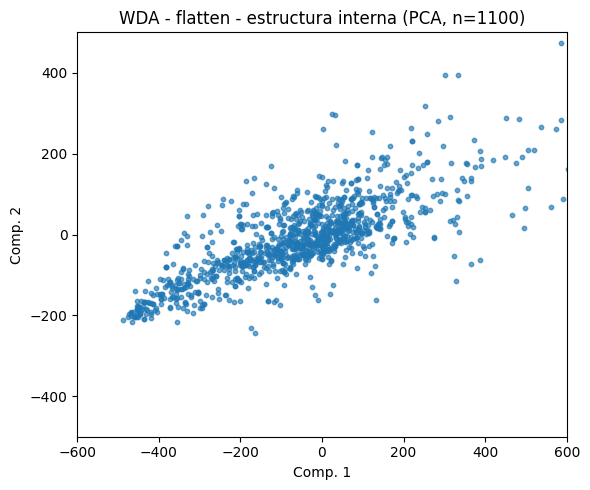

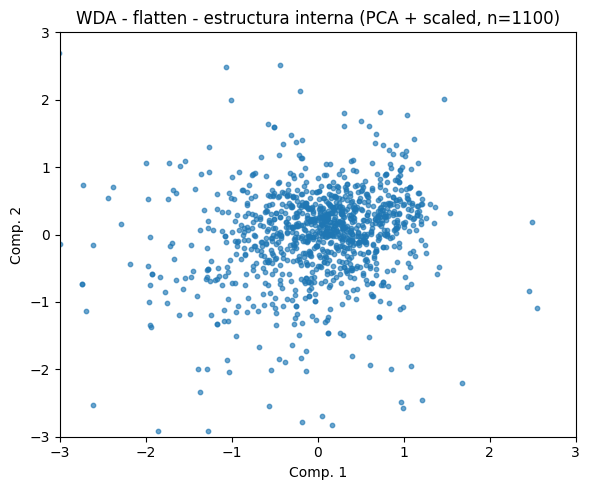

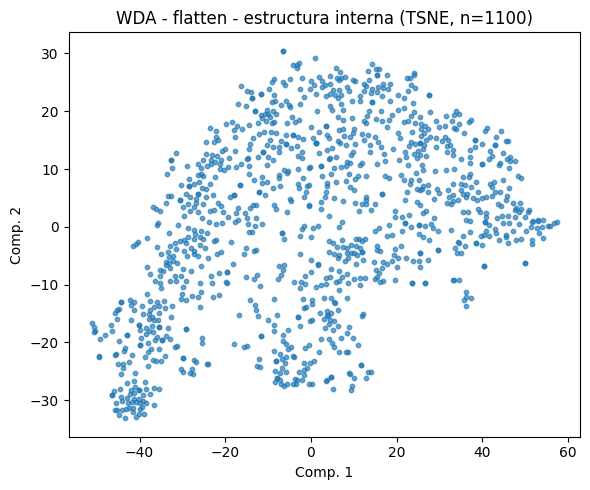

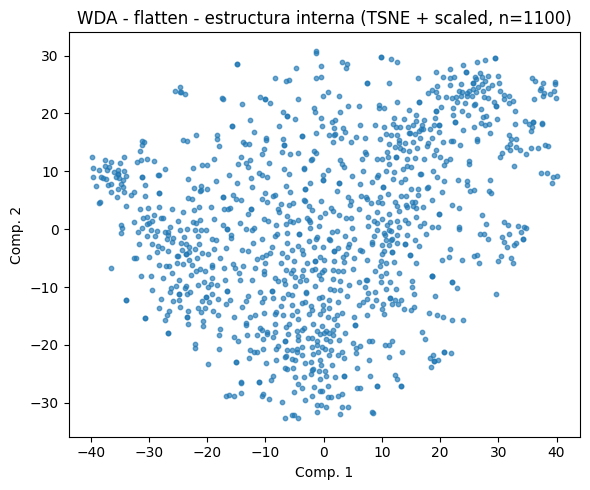

In [ ]:
# PCA sin escalar
plot_internal_structure_2d(
    repr_wda_32["flatten"],
    "WDA",
    "flatten",
    method="pca",
    xlim=(-600,600),
    ylim=(-500, 500)
)

# PCA escalando
#plot_internal_structure_2d(repr_wda_32["flatten"], "WDA", "flatten", method="pca", xlim=(-3,3), ylim=(-3,3), scale_before_pca=True)

# tSNE sin escalar
plot_internal_structure_2d(
    repr_wda_32["flatten"],
    "WDA",
    "flatten",
    method="tsne",
    #xlim=(-550,400),
    #ylim=(-350, 400)
)

# tSNE escalando
#plot_internal_structure_2d(repr_wda_32["flatten"], "WDA", "flatten", method="tsne", scale_before_tsne=True)

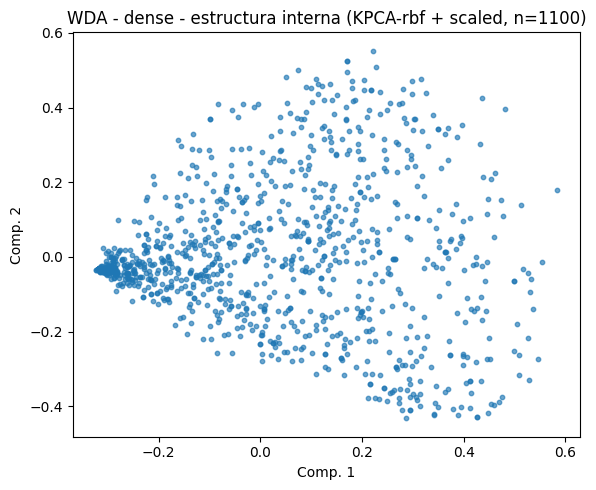

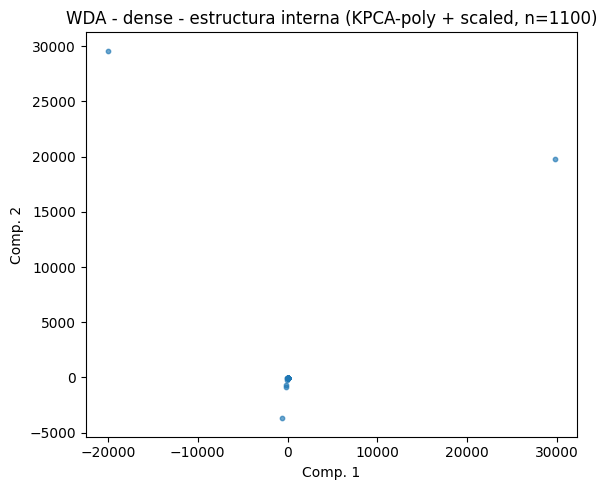

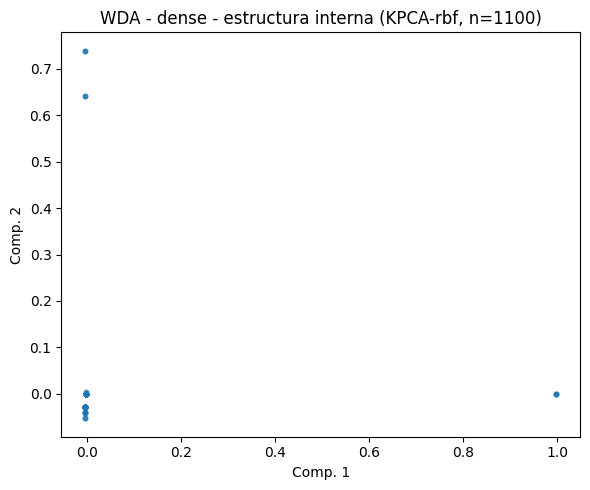

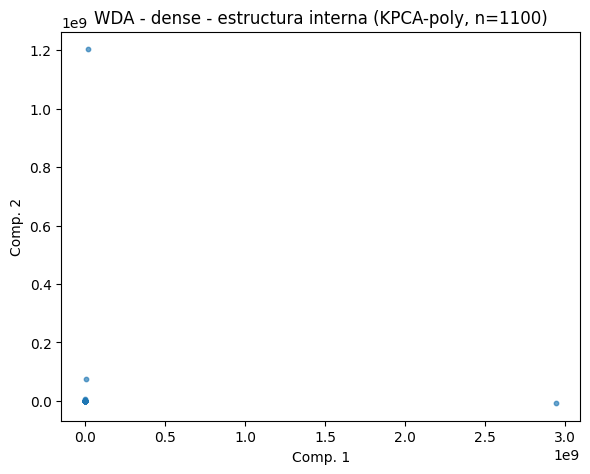

In [ ]:
# kernel pca escalado
plot_internal_structure_2d(repr_wda_32["dense"], "WDA", "dense", method="kpca", kpca_kernel="rbf", kpca_gamma=0.1)
plot_internal_structure_2d(repr_wda_32["dense"], "WDA", "dense", method="kpca", kpca_kernel="poly", kpca_degree=3, kpca_gamma=1)

# kernel pca sin escalar 
plot_internal_structure_2d(repr_wda_32["dense"], "WDA", "dense", method="kpca", kpca_kernel="rbf", kpca_gamma=0.1, scale_before_kpca=False)
plot_internal_structure_2d(repr_wda_32["dense"], "WDA", "dense", method="kpca", kpca_kernel="poly", kpca_degree=3, kpca_gamma=1, scale_before_kpca=False)


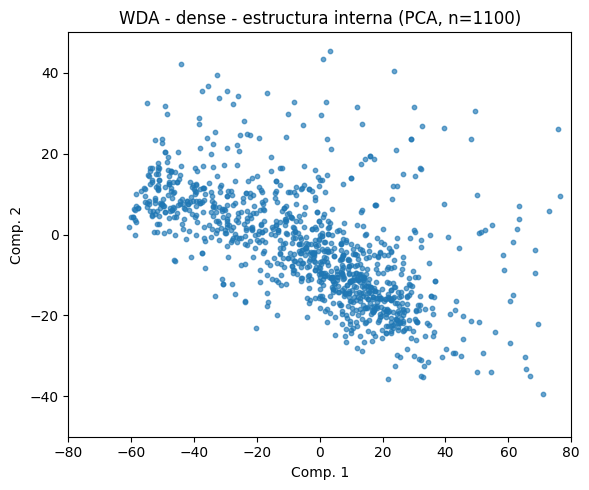

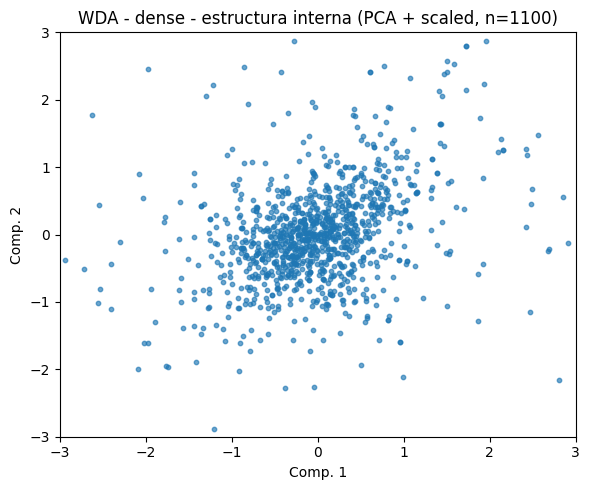

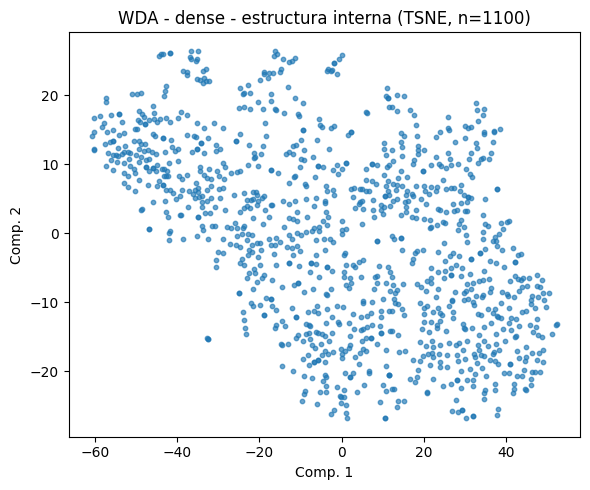

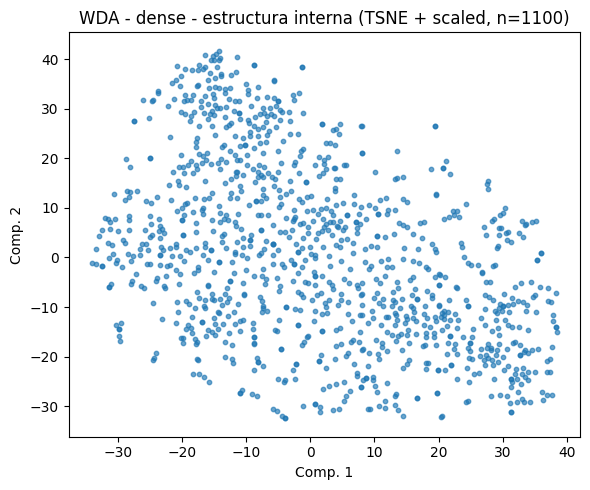

In [ ]:
plot_internal_structure_2d(
    repr_wda_32["dense"],
    "WDA",
    "dense",
    method="pca",
    xlim=(-80, 80),
    ylim=(-50, 50)
)

# PCA escalando
plot_internal_structure_2d(repr_wda_32["dense"], "WDA", "dense", method="pca", xlim=(-3,3), ylim=(-3,3), scale_before_pca=True)

# tSNE sin escalar
plot_internal_structure_2d(
    repr_wda_32["dense"],
    "WDA",
    "dense",
    method="tsne",
    #xlim=(-550,400),
    #ylim=(-350, 400)
)

# tSNE escalando
plot_internal_structure_2d(repr_wda_32["dense"], "WDA", "dense", method="tsne", scale_before_tsne=True)


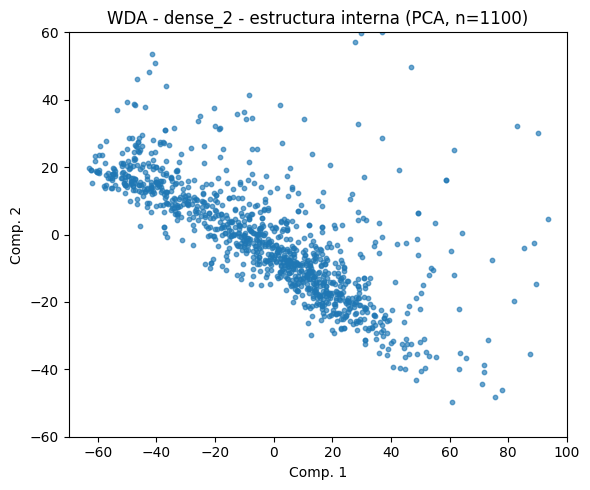

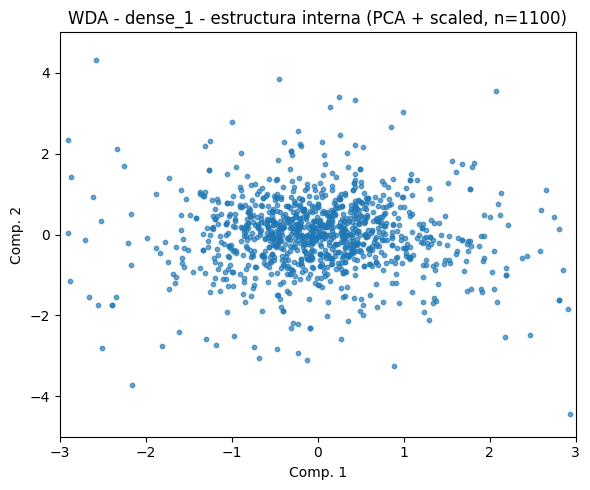

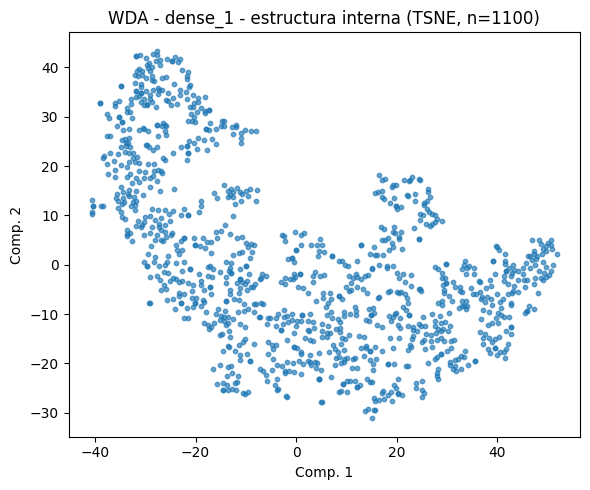

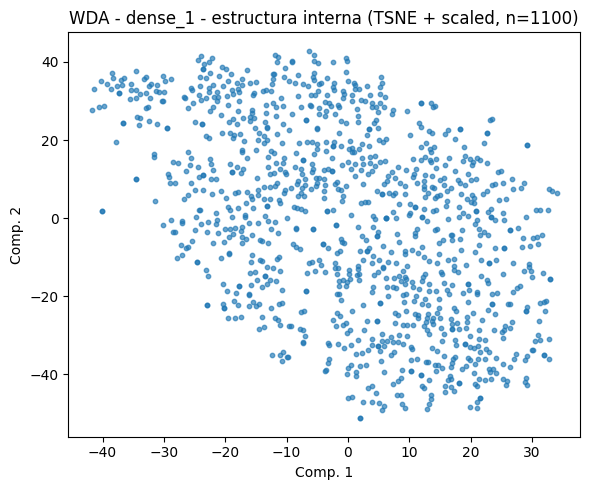

In [ ]:
plot_internal_structure_2d(
    repr_wda_32["dense_1"],
    "WDA",
    "dense_1",
    method="pca",
    xlim=(-70, 100),
    ylim=(-60, 60)
)

# PCA escalando
plot_internal_structure_2d(repr_wda_32["dense_1"], "WDA", "dense_1", method="pca", xlim=(-3,3), ylim=(-5,5), scale_before_pca=True)


# tSNE sin escalar
plot_internal_structure_2d(
    repr_wda_32["dense_1"],
    "WDA",
    "dense_1",
    method="tsne",
    #xlim=(-550,400),
    #ylim=(-350, 400)
)

# tSNE escalando
plot_internal_structure_2d(repr_wda_32["dense_1"], "WDA", "dense_1", method="tsne", scale_before_tsne=True)


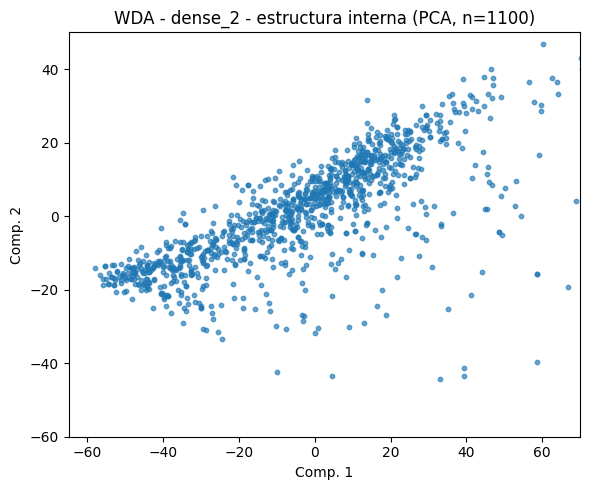

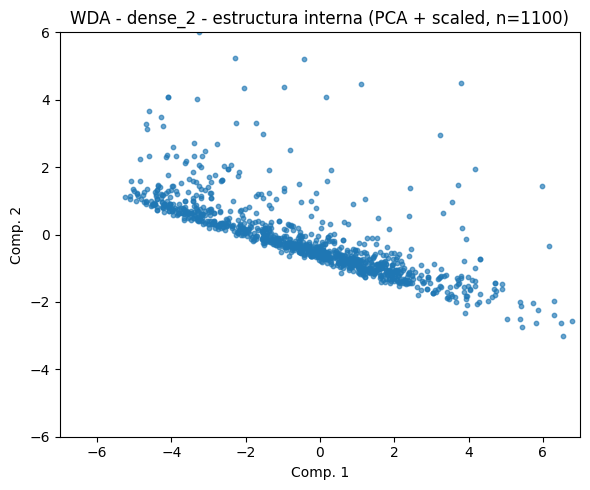

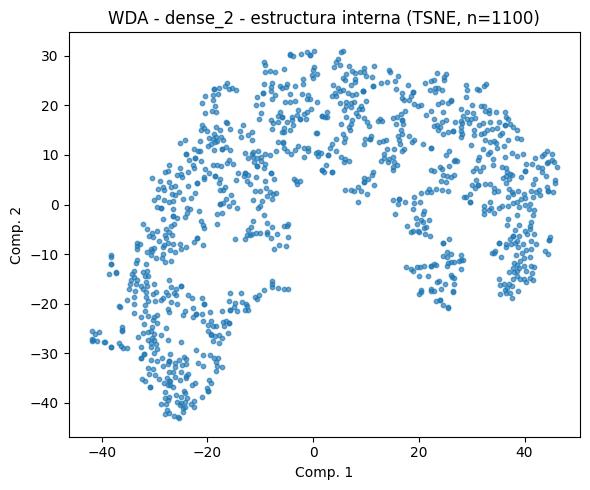

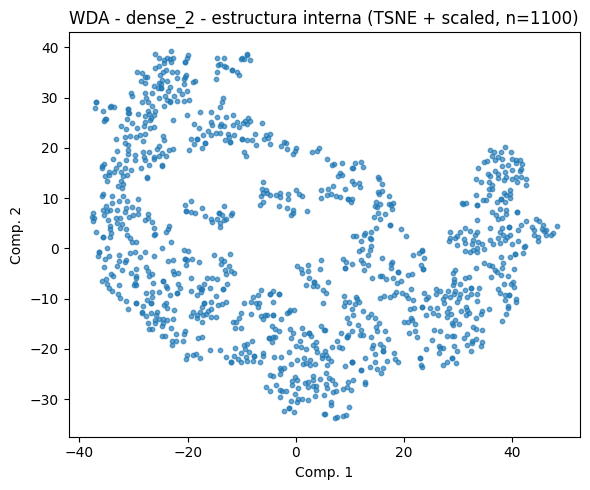

In [ ]:
# pca sin escalar
plot_internal_structure_2d(
    repr_wda_32["dense_2"],
    "WDA",
    "dense_2",
    method="pca",
    xlim=(-65, 70),
    ylim=(-60, 50)
)

# PCA escalando
plot_internal_structure_2d(repr_wda_32["dense_2"], "WDA", "dense_2", method="pca", xlim=(-7,7), ylim=(-6,6), scale_before_pca=True)

# tSNE sin escalar
plot_internal_structure_2d(
    repr_wda_32["dense_2"],
    "WDA",
    "dense_2",
    method="tsne",
    #xlim=(-550,400),
    #ylim=(-350, 400)
)

# tSNE escalando
plot_internal_structure_2d(repr_wda_32["dense_2"], "WDA", "dense_2", method="tsne", scale_before_tsne=True)


In [ ]:
# no usar por ahora
def plot_all_internal_structures(representations_32, class_name, method="pca"):
    for layer_name, feats in representations_32.items():
        plot_internal_structure_2d(feats, class_name, layer_name, method=method)

In [15]:
def evaluate_kmeans_k(features_32, class_name, layer_name, k_values=range(2, 9)):
    Xs = StandardScaler().fit_transform(features_32)

    #inertias = []
    silhouettes = []

    for k in k_values:
        km = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = km.fit_predict(Xs)

        #inertias.append(km.inertia_)
        silhouettes.append(silhouette_score(Xs, labels))

    plt.figure(figsize=(12,4))
    
    '''
    plt.subplot(1,2,1)
    plt.plot(list(k_values), inertias, marker='o')
    plt.title(f"{class_name} - {layer_name} - Elbow")
    plt.xlabel("k")
    plt.ylabel("Inercia")
    '''
    #plt.subplot(1,2,2)
    n_samples = features_32.shape[0]
    plt.plot(list(k_values), silhouettes, marker='o')
    plt.title(f"{class_name} - {layer_name} - Silhouette(n={n_samples})")
    #plt.legend([f"n={n_samples}"])
    plt.xlabel("k")
    plt.ylabel("Silhouette")

    plt.tight_layout()
    plt.show()

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering


def cluster_and_plot(features_32, class_name, layer_name, 
                     kmeans_k=3, spectral_k=3, 
                     dbscan_eps=1.5, dbscan_min_samples=10,
                     vis_method="pca", xlim=None, ylim=None):
    
    Xs = StandardScaler().fit_transform(features_32)

    # Reducir a 2D solo para visualizar
    if vis_method.lower() == "pca":
        emb_2d = PCA(n_components=2, random_state=42).fit_transform(Xs)
    elif vis_method.lower() == "tsne":
        emb_2d = TSNE(n_components=2, random_state=42, perplexity=30, init='pca').fit_transform(Xs)
    else:
        raise ValueError("vis_method debe ser 'pca' o 'tsne'")

    # etiqueta legible del metodo de proyeccion, para incluirla en los titulos
    vis_label = "PCA" if vis_method.lower() == "pca" else "t-SNE"

    # Clustering
    km = KMeans(n_clusters=kmeans_k, random_state=42, n_init=10)
    km_labels = km.fit_predict(Xs)

    db = DBSCAN(eps=dbscan_eps, min_samples=dbscan_min_samples)
    db_labels = db.fit_predict(Xs)

    sc = SpectralClustering(n_clusters=spectral_k, random_state=42, affinity='nearest_neighbors')
    sc_labels = sc.fit_predict(Xs)

    fig, axes = plt.subplots(3, 1, figsize=(9, 16))
    n_samples = features_32.shape[0]
    cmap = plt.cm.viridis

    def add_cluster_legend(ax, labels):
        unique_labels = np.unique(labels)
        handles = []

        # Normalización para mapear labels a colores del cmap
        if len(unique_labels) > 1:
            label_min = unique_labels.min()
            label_max = unique_labels.max()
        else:
            label_min = label_max = unique_labels[0]

        for lab in unique_labels:
            count = np.sum(labels == lab)

            # Caso especial DBSCAN: ruido = -1
            if lab == -1:
                color = "black"
                text = f"ruido (-1): n={count}"
            else:
                if label_max == label_min:
                    color = cmap(0.5)
                else:
                    color = cmap((lab - label_min) / (label_max - label_min))
                text = f"cluster {lab}: n={count}"

            handles.append(
                Line2D([0], [0],
                       marker='o',
                       color='w',
                       markerfacecolor=color,
                       markersize=8,
                       label=text)
            )

        ax.legend(handles=handles, title="Clusters", loc="best", fontsize=9)

    # KMeans
    axes[0].scatter(emb_2d[:, 0], emb_2d[:, 1], c=km_labels, s=30, alpha=0.6, cmap='viridis')
    axes[0].set_title(f"{class_name} - {layer_name} - KMeans (k={kmeans_k}, n={n_samples}) - {vis_label}", fontsize=15)
    add_cluster_legend(axes[0], km_labels)

    # DBSCAN
    axes[1].scatter(emb_2d[:, 0], emb_2d[:, 1], c=db_labels, s=30, alpha=0.6, cmap='viridis')
    axes[1].set_title(f"{class_name} - {layer_name} - DBSCAN (n={n_samples}) - {vis_label}", fontsize=15)
    add_cluster_legend(axes[1], db_labels)

    # Spectral
    axes[2].scatter(emb_2d[:, 0], emb_2d[:, 1], c=sc_labels, s=30, alpha=0.6, cmap='viridis')
    axes[2].set_title(f"{class_name} - {layer_name} - Spectral (k={spectral_k}, n={n_samples}) - {vis_label}", fontsize=15)
    add_cluster_legend(axes[2], sc_labels)

    for ax in axes:
        ax.set_xlabel("Comp. 1")
        ax.set_ylabel("Comp. 2")

        if xlim is not None:
            ax.set_xlim(xlim)
        if ylim is not None:
            ax.set_ylim(ylim)

    plt.tight_layout(pad=3.0)
    plt.show()

    return {
        "kmeans": km_labels,
        "dbscan": db_labels,
        "spectral": sc_labels
    }

In [ ]:
def cluster_all_layers(representations_32, class_name,
                       kmeans_k_dict=None,
                       spectral_k_dict=None,
                       dbscan_eps_dict=None,
                       dbscan_min_samples=10,
                       vis_method="pca"):
    
    if kmeans_k_dict is None:
        kmeans_k_dict = {"flatten":3, "dense":3, "dense_1":3, "dense_2":3}
    if spectral_k_dict is None:
        spectral_k_dict = {"flatten":3, "dense":3, "dense_1":3, "dense_2":3}
    if dbscan_eps_dict is None:
        dbscan_eps_dict = {"flatten":1.5, "dense":1.5, "dense_1":1.5, "dense_2":1.5}

    cluster_results = {}

    for layer_name, feats in representations_32.items():
        print(f"\nClustering {class_name} - {layer_name}")
        cluster_results[layer_name] = cluster_and_plot(
            feats,
            class_name,
            layer_name,
            kmeans_k=kmeans_k_dict[layer_name],
            spectral_k=spectral_k_dict[layer_name],
            dbscan_eps=dbscan_eps_dict[layer_name],
            dbscan_min_samples=dbscan_min_samples,
            vis_method=vis_method
        )

    return cluster_results

In [ ]:
#plot_all_internal_structures(repr_wda_32, "WDA", method="pca")

In [ ]:
#plot_all_internal_structures(repr_wda_32, "WDA", method="tsne")

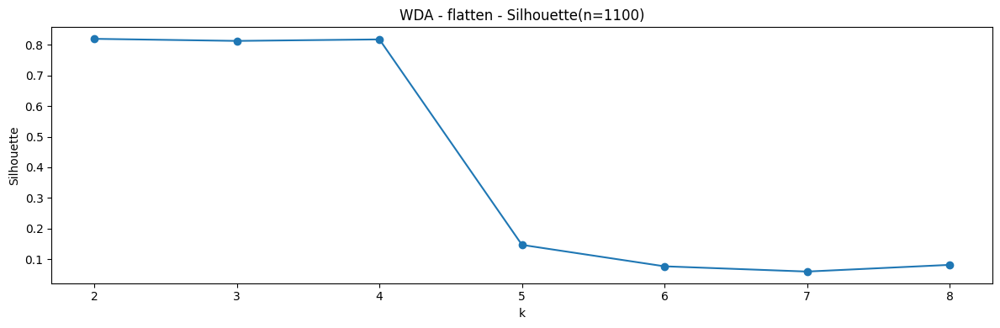

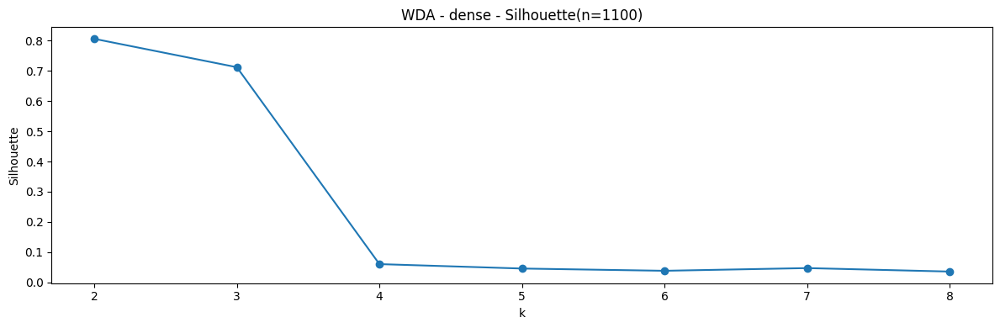

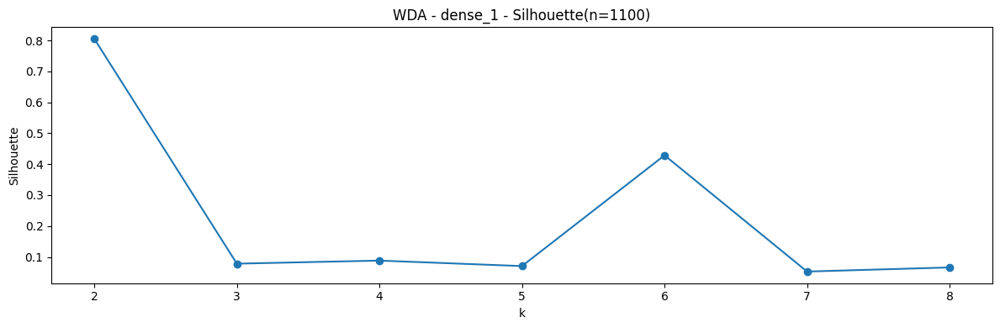

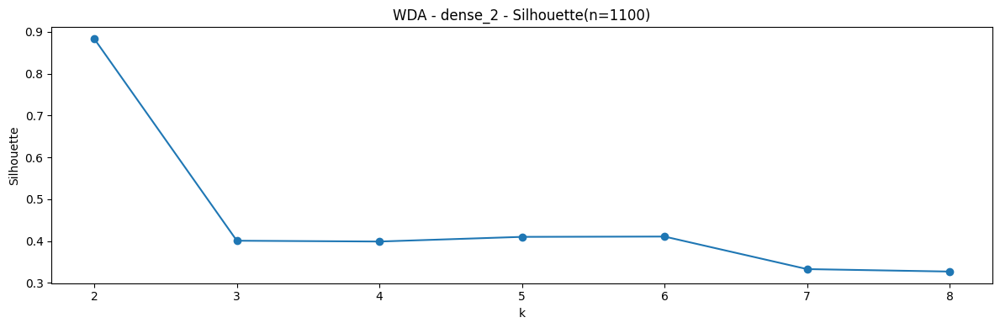

In [ ]:
evaluate_kmeans_k(repr_wda_32["flatten"], "WDA", "flatten")
evaluate_kmeans_k(repr_wda_32["dense"], "WDA", "dense")
evaluate_kmeans_k(repr_wda_32["dense_1"], "WDA", "dense_1")
evaluate_kmeans_k(repr_wda_32["dense_2"], "WDA", "dense_2")

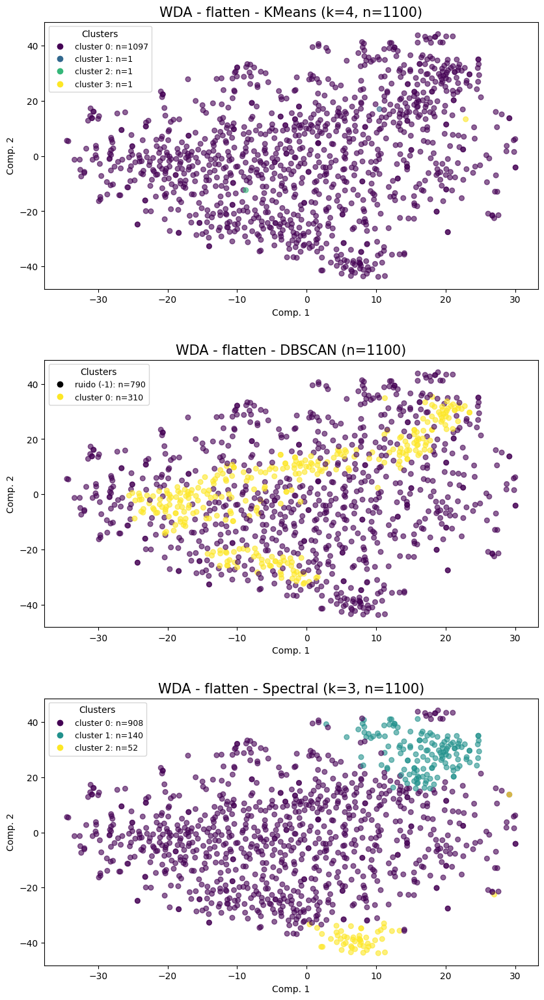

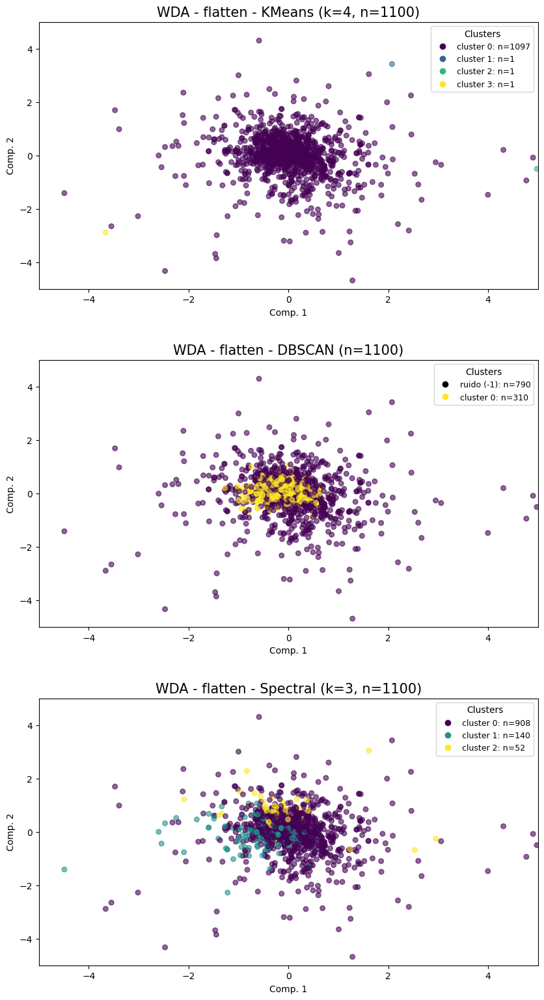

{'kmeans': array([0, 0, 0, ..., 0, 0, 0], dtype=int32),
 'dbscan': array([ 0, -1, -1, ..., -1, -1, -1]),
 'spectral': array([0, 1, 0, ..., 0, 0, 0], dtype=int32)}

In [17]:
# 4 primeros gráficos con TSNE
cluster_and_plot(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            kmeans_k=4,
            spectral_k=3,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="tsne"
        )
# 4 últimos gráficos con PCA
cluster_and_plot(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            kmeans_k=4,
            spectral_k=3,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="pca",
            xlim=(-5,5), ylim=(-5,5)
        )

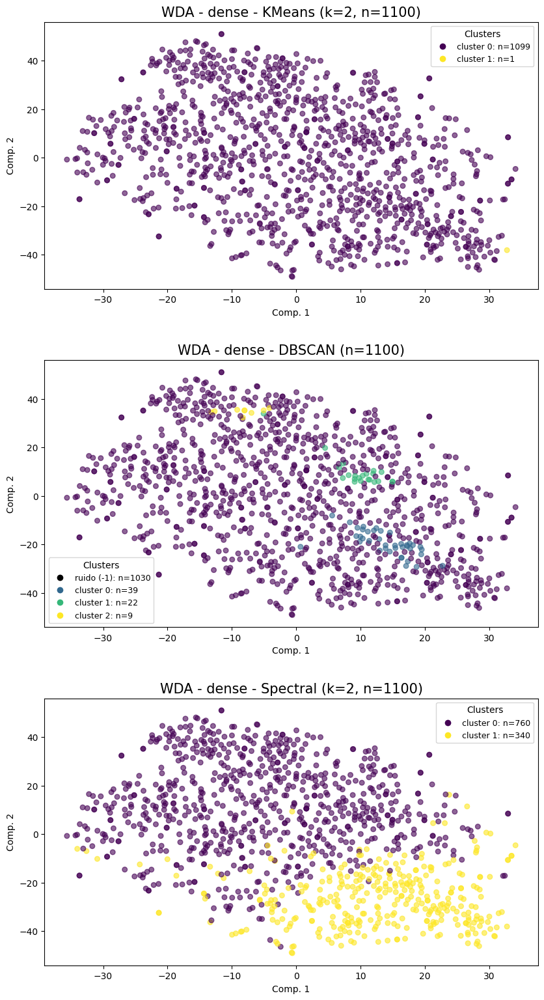

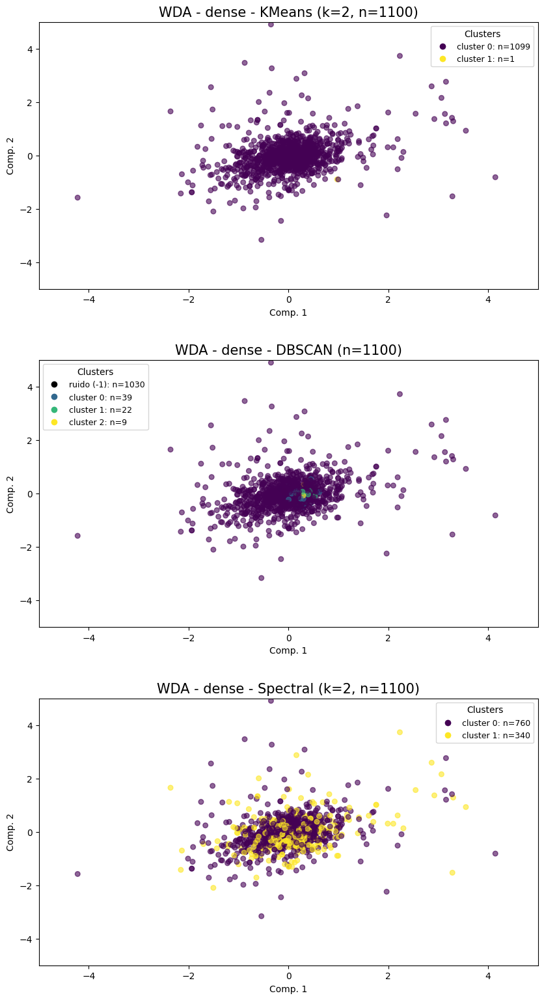

{'kmeans': array([0, 0, 0, ..., 0, 0, 0], dtype=int32),
 'dbscan': array([-1,  0, -1, ..., -1, -1, -1]),
 'spectral': array([0, 1, 0, ..., 0, 0, 0], dtype=int32)}

In [18]:
cluster_and_plot(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="tsne"
        )

cluster_and_plot(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="pca",
            xlim=(-5,5), ylim=(-5,5)
        )

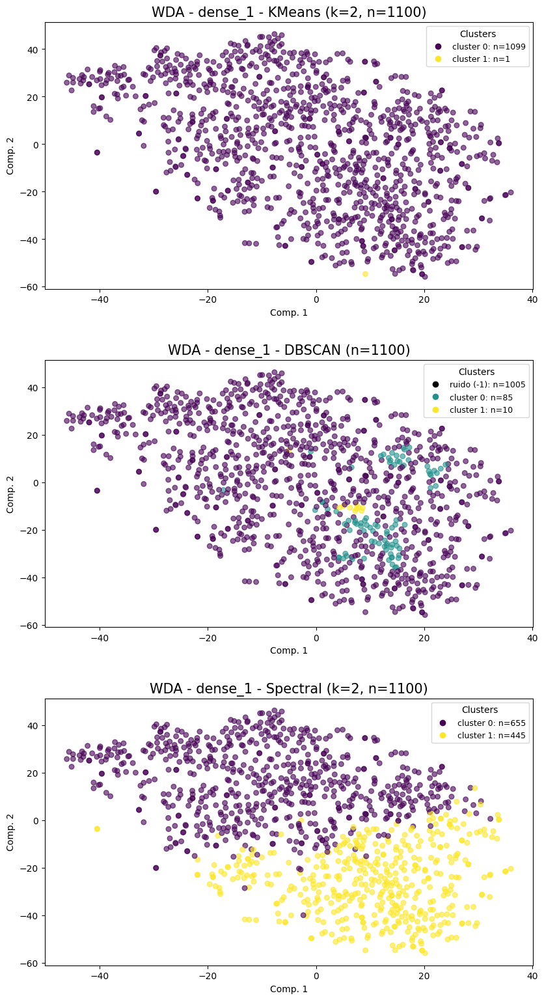

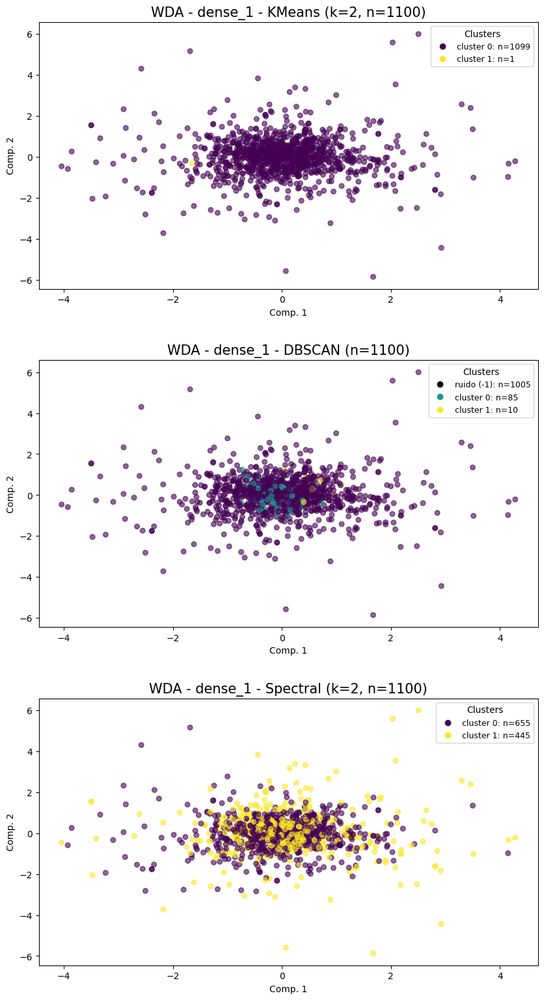

{'kmeans': array([0, 0, 0, ..., 0, 0, 0], dtype=int32),
 'dbscan': array([-1,  0, -1, ..., -1, -1, -1]),
 'spectral': array([0, 1, 1, ..., 1, 0, 0], dtype=int32)}

In [19]:
cluster_and_plot(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="tsne"
        )

cluster_and_plot(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="pca",
            #xlim=(-5,5), ylim=(-5,5)
        )

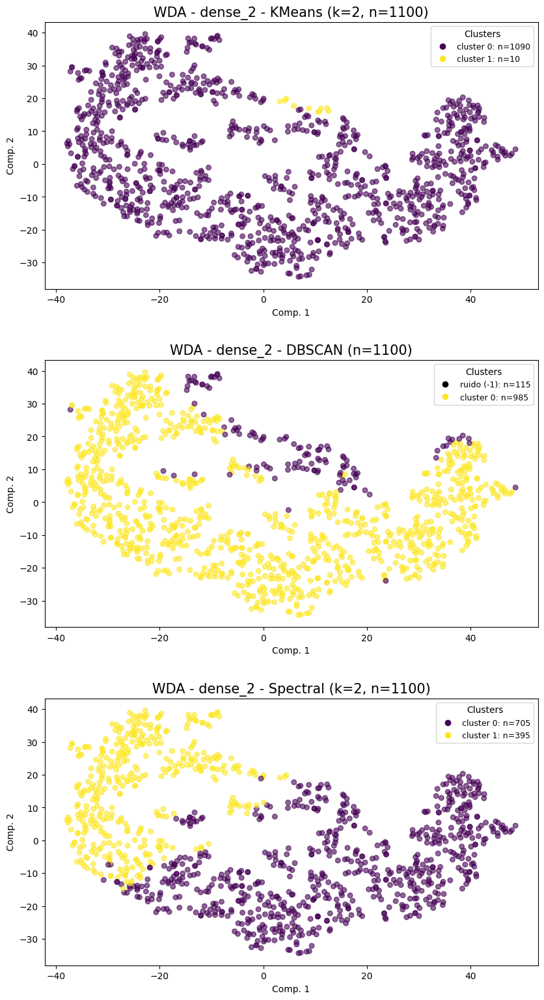

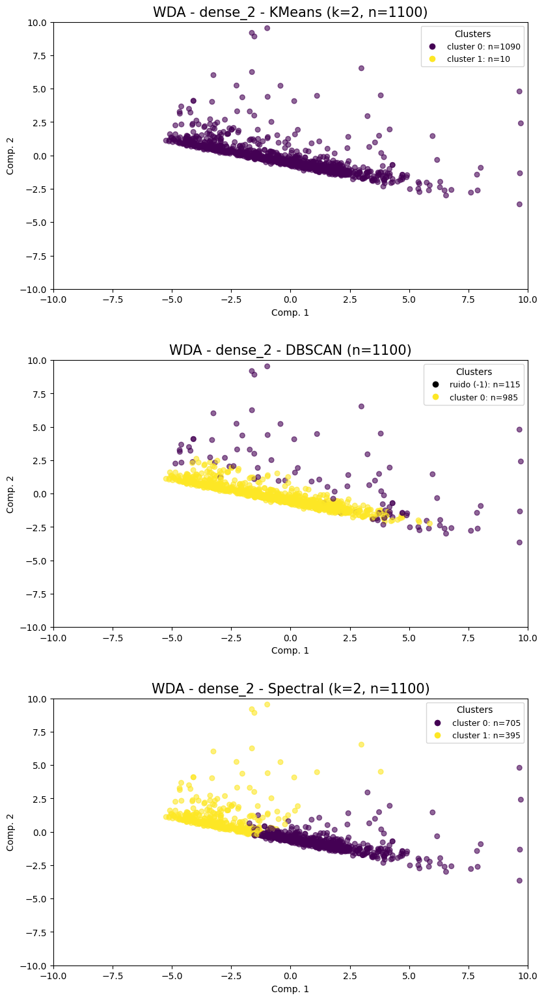

{'kmeans': array([0, 0, 0, ..., 0, 0, 0], dtype=int32),
 'dbscan': array([0, 0, 0, ..., 0, 0, 0]),
 'spectral': array([0, 1, 1, ..., 1, 0, 0], dtype=int32)}

In [20]:
cluster_and_plot(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="tsne"
        )

cluster_and_plot(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10)
        )

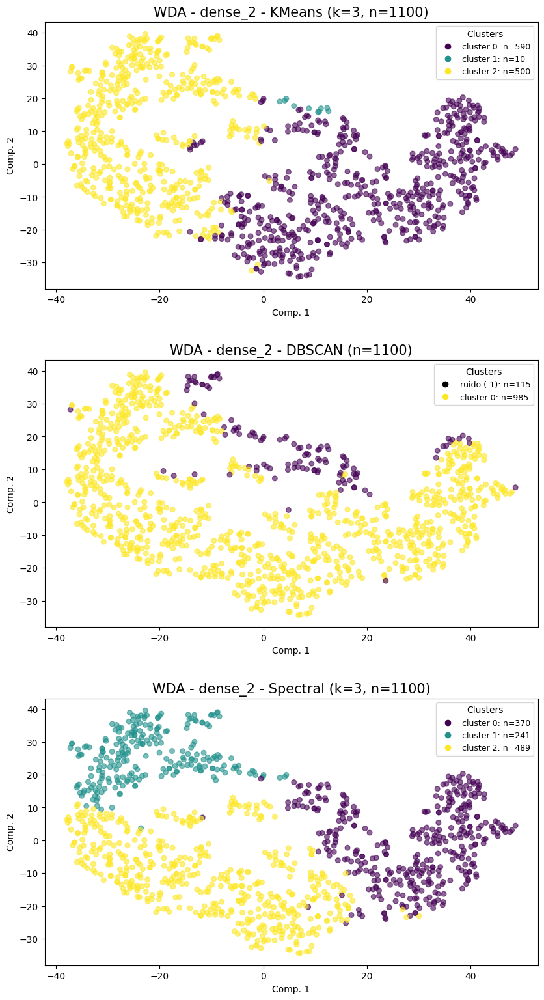

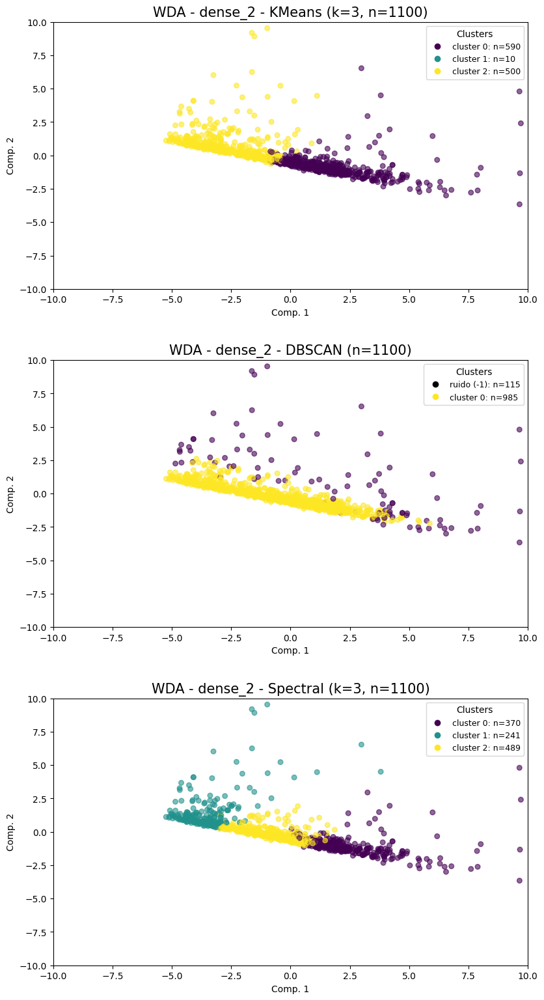

{'kmeans': array([0, 2, 2, ..., 2, 0, 0], dtype=int32),
 'dbscan': array([0, 0, 0, ..., 0, 0, 0]),
 'spectral': array([0, 1, 2, ..., 2, 0, 2], dtype=int32)}

In [21]:
cluster_and_plot(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            kmeans_k=3,
            spectral_k=3,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="tsne"
        )

cluster_and_plot(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            kmeans_k=3,
            spectral_k=3,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10)
        )

Tarea 3:
Agregar legend con nombre de cluster y cantidad de muestras por cluster
Generar espectros de WDA con DBSCAN cerca de la capa de salida 
Cambiar el k (k=3) 
Usar interact con jupyter notebook (ej. para ir cambiando de capa, ON/OFF línea de emisión, ON/OFF graficar varianza sobre los espectros generados VER FOTO, etc)
Paquete de software que ponga las líneas de emisión sobre el espectro
*Spectral Clustering capa interna y capa de salida DBSCAN
(cluster -1 significa no lo puse en ningún cluster -> DBSCAN, HDBSCAN, etc)

In [ ]:
# Experimento WDB
X_wdb, df_wdb = load_class_spectra("WDB", n_samples=1100, random_state=42)

flatten_wdb, dense_wdb, dense1_wdb, dense2_wdb = extract_layer_features(X_wdb)

repr_wdb_32 = reduce_all_to_32(flatten_wdb, dense_wdb, dense1_wdb, dense2_wdb)

WDB: disponibles con match a .dat = 1184
WDB: espectros válidos finales = 1099
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
flatten: (1099, 208)
dense: (1099, 128)
dense_1: (1099, 64)
dense_2: (1099, 32)
flatten_32: (1099, 32)
dense_32: (1099, 32)
dense1_32: (1099, 32)
dense2_32: (1099, 32)


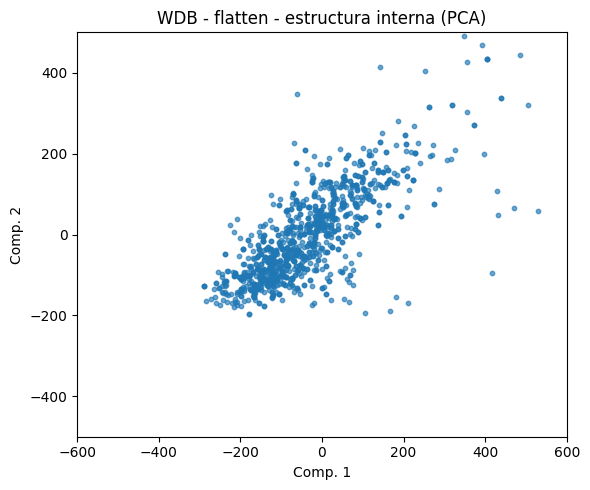

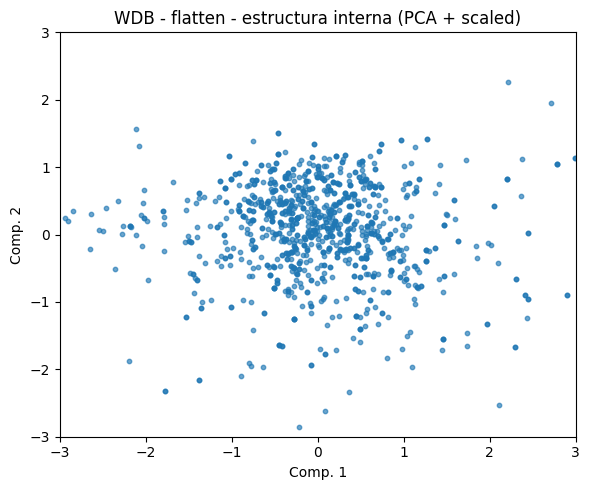

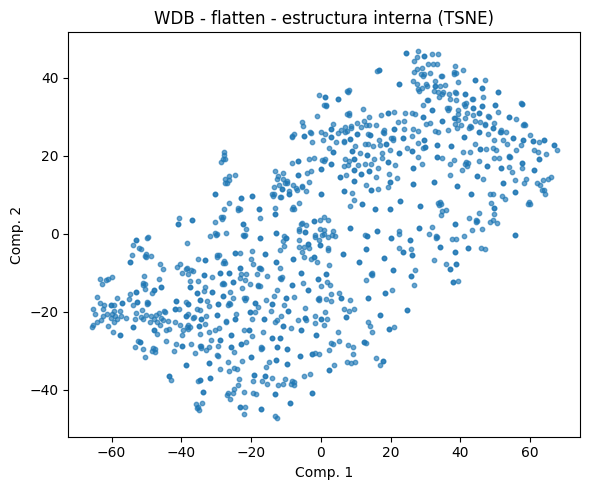

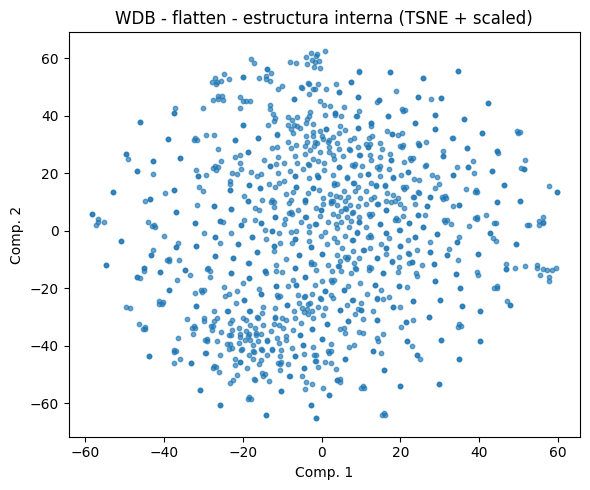

In [ ]:
# PCA sin escalar
plot_internal_structure_2d(
    repr_wdb_32["flatten"],
    "WDB",
    "flatten",
    method="pca",
    xlim=(-600,600),
    ylim=(-500, 500)
)

# PCA escalando
plot_internal_structure_2d(repr_wdb_32["flatten"], "WDB", "flatten", method="pca", xlim=(-3,3), ylim=(-3,3), scale_before_pca=True)

# tSNE sin escalar
plot_internal_structure_2d(
    repr_wdb_32["flatten"],
    "WDB",
    "flatten",
    method="tsne",
    #xlim=(-550,400),
    #ylim=(-350, 400)
)

# tSNE escalando
plot_internal_structure_2d(repr_wdb_32["flatten"], "WDB", "flatten", method="tsne", scale_before_tsne=True)

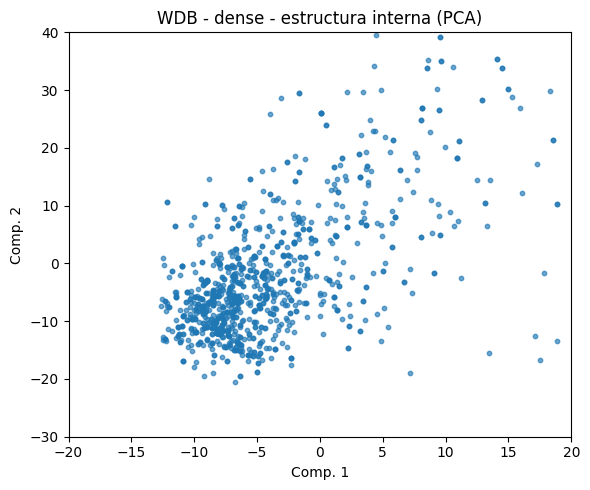

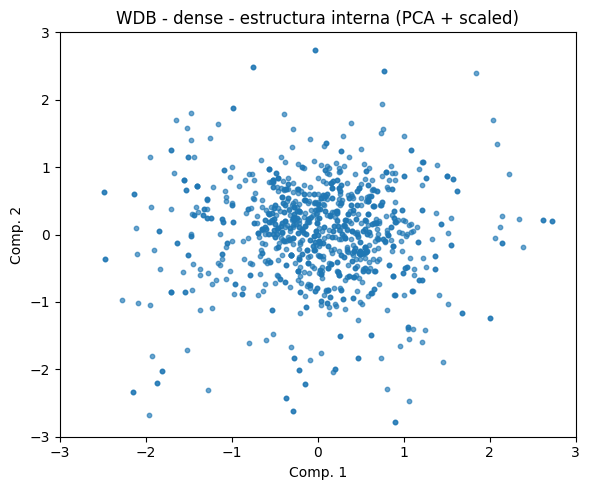

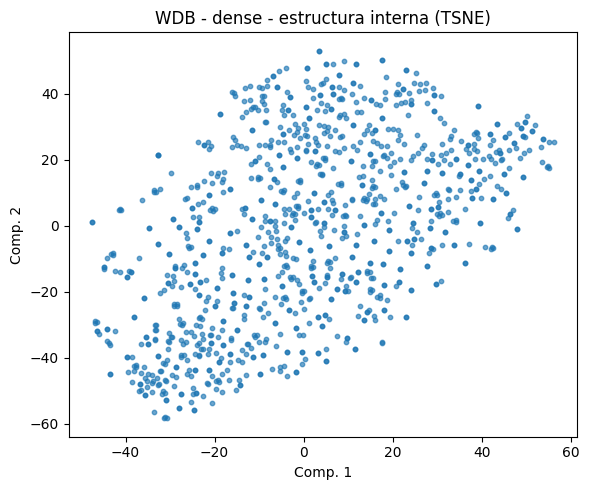

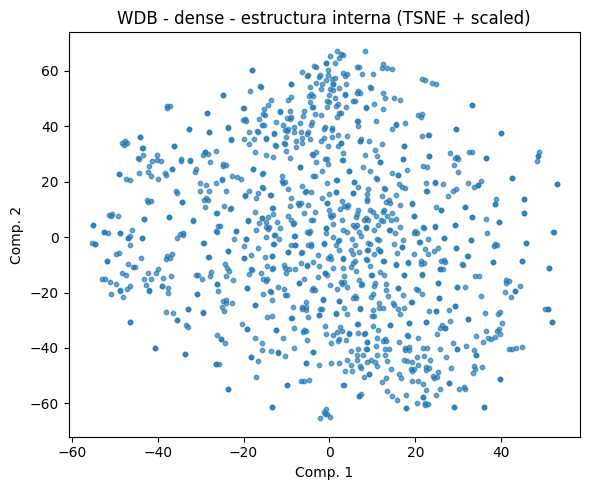

In [ ]:
# PCA sin escalar
plot_internal_structure_2d(
    repr_wdb_32["dense"],
    "WDB",
    "dense",
    method="pca",
    xlim=(-20,20),
    ylim=(-30, 40)
)

# PCA escalando
plot_internal_structure_2d(repr_wdb_32["dense"], "WDB", "dense", method="pca", xlim=(-3,3), ylim=(-3,3), scale_before_pca=True)

# tSNE sin escalar
plot_internal_structure_2d(
    repr_wdb_32["dense"],
    "WDB",
    "dense",
    method="tsne",
    #xlim=(-550,400),
    #ylim=(-350, 400)
)

# tSNE escalando
plot_internal_structure_2d(repr_wdb_32["dense"], "WDB", "dense", method="tsne", scale_before_tsne=True)

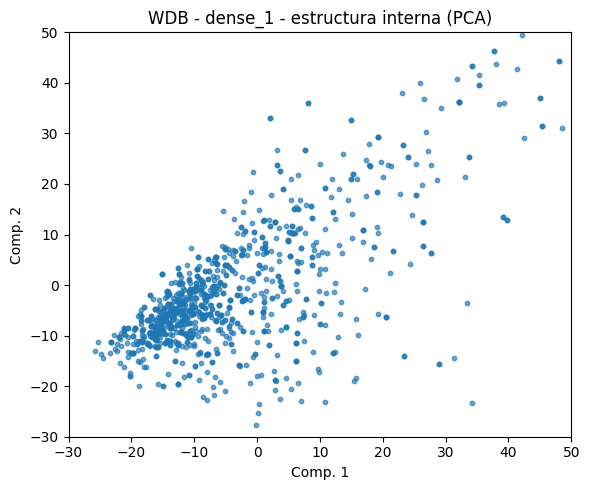

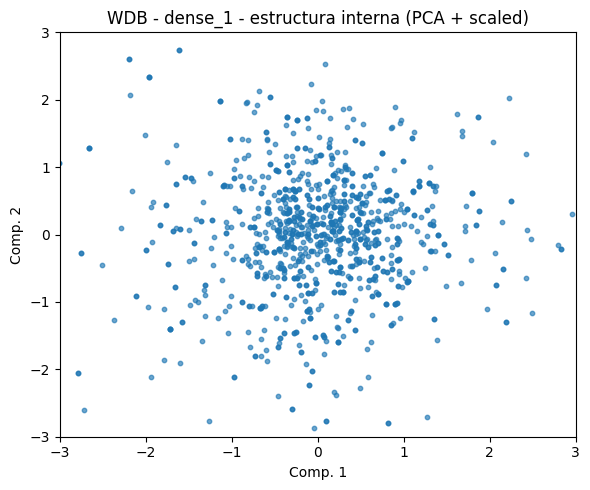

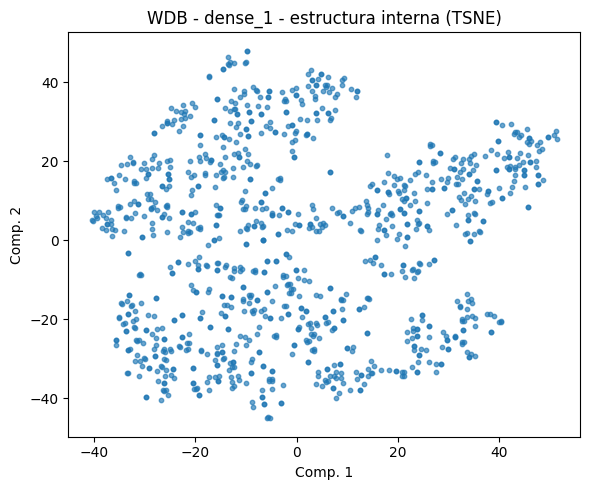

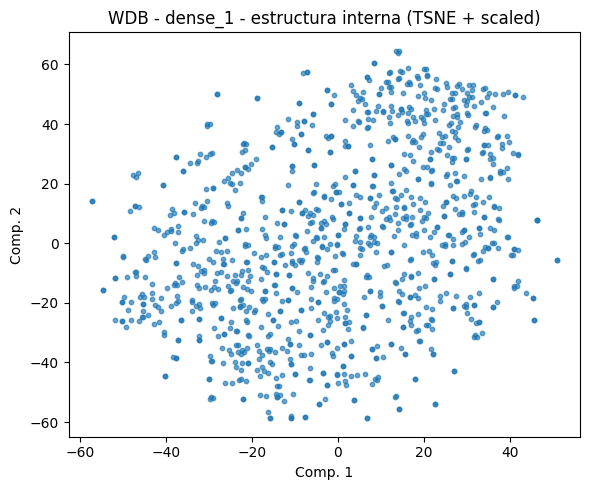

In [ ]:
# PCA sin escalar
plot_internal_structure_2d(
    repr_wdb_32["dense_1"],
    "WDB",
    "dense_1",
    method="pca",
    xlim=(-30,50),
    ylim=(-30, 50)
)

# PCA escalando
plot_internal_structure_2d(repr_wdb_32["dense_1"], "WDB", "dense_1", method="pca", xlim=(-3,3), ylim=(-3,3), scale_before_pca=True)

# tSNE sin escalar
plot_internal_structure_2d(
    repr_wdb_32["dense_1"],
    "WDB",
    "dense_1",
    method="tsne",
    #xlim=(-550,400),
    #ylim=(-350, 400)
)

# tSNE escalando
plot_internal_structure_2d(repr_wdb_32["dense_1"], "WDB", "dense_1", method="tsne", scale_before_tsne=True)

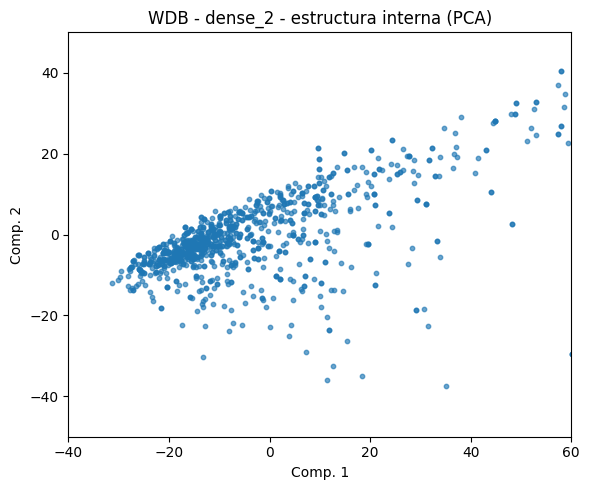

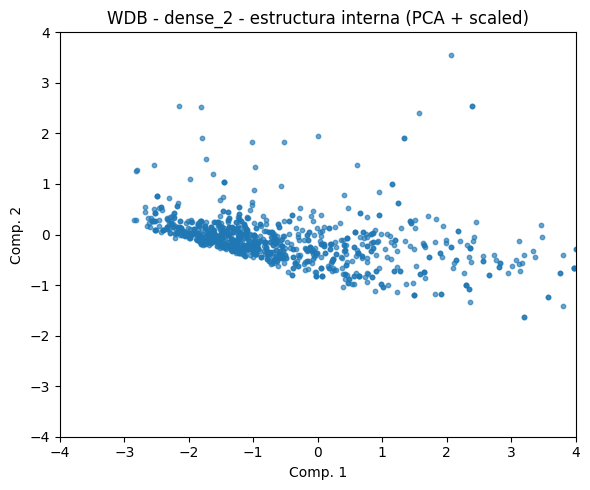

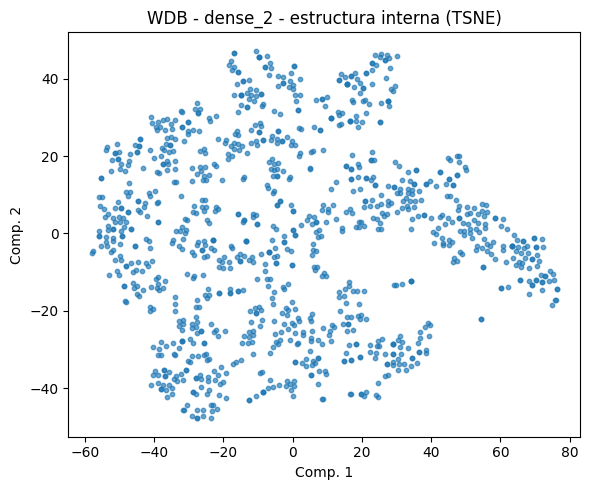

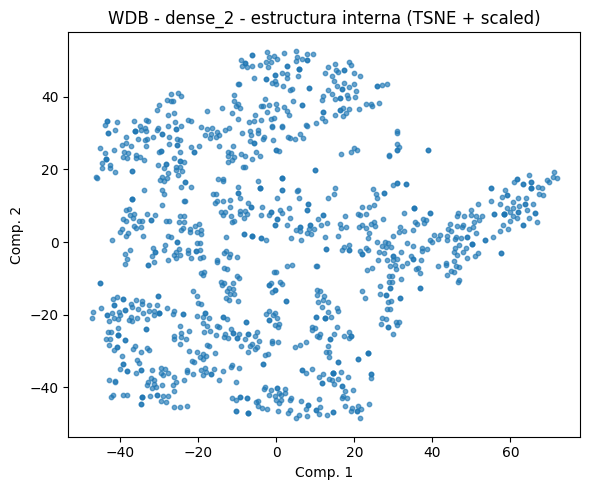

In [ ]:
# PCA sin escalar
plot_internal_structure_2d(
    repr_wdb_32["dense_2"],
    "WDB",
    "dense_2",
    method="pca",
    xlim=(-40,60),
    ylim=(-50, 50)
)

# PCA escalando
plot_internal_structure_2d(repr_wdb_32["dense_2"], "WDB", "dense_2", method="pca", xlim=(-4,4), ylim=(-4,4), scale_before_pca=True)

# tSNE sin escalar
plot_internal_structure_2d(
    repr_wdb_32["dense_2"],
    "WDB",
    "dense_2",
    method="tsne",
    #xlim=(-550,400),
    #ylim=(-350, 400)
)

# tSNE escalando
plot_internal_structure_2d(repr_wdb_32["dense_2"], "WDB", "dense_2", method="tsne", scale_before_tsne=True)

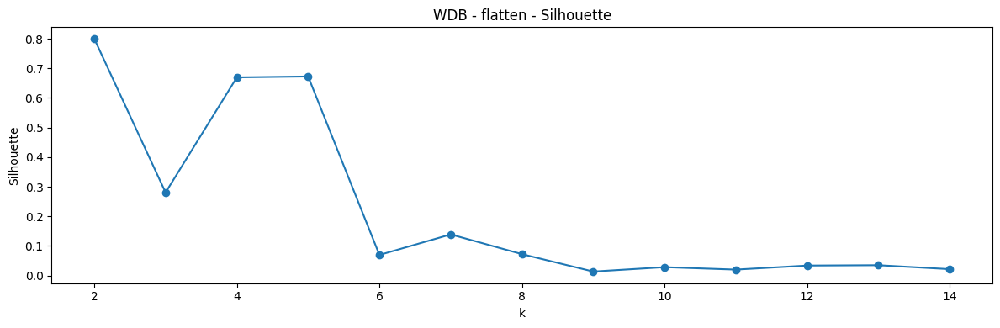

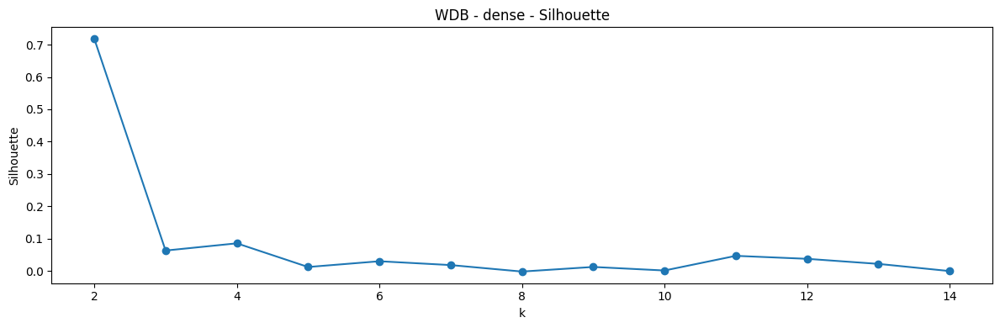

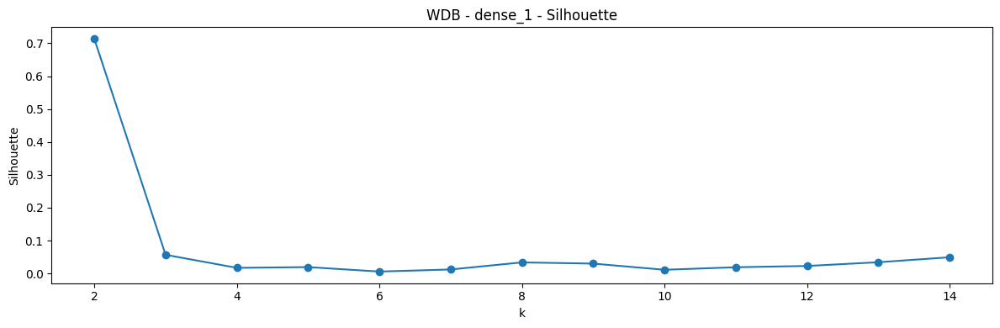

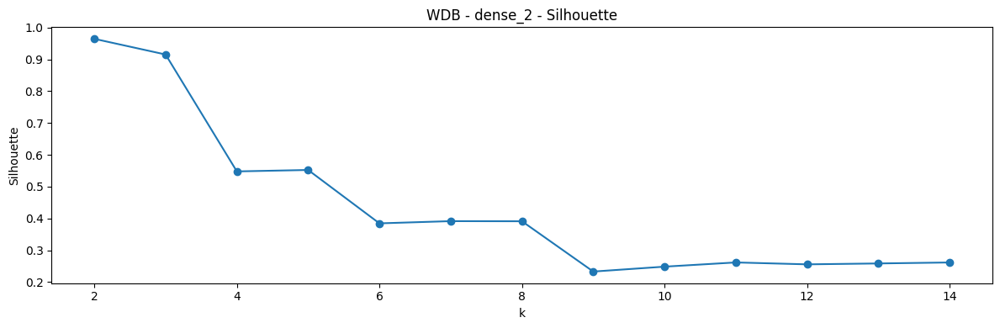

In [ ]:
evaluate_kmeans_k(repr_wdb_32["flatten"], "WDB", "flatten")
evaluate_kmeans_k(repr_wdb_32["dense"], "WDB", "dense")
evaluate_kmeans_k(repr_wdb_32["dense_1"], "WDB", "dense_1")
evaluate_kmeans_k(repr_wdb_32["dense_2"], "WDB", "dense_2")

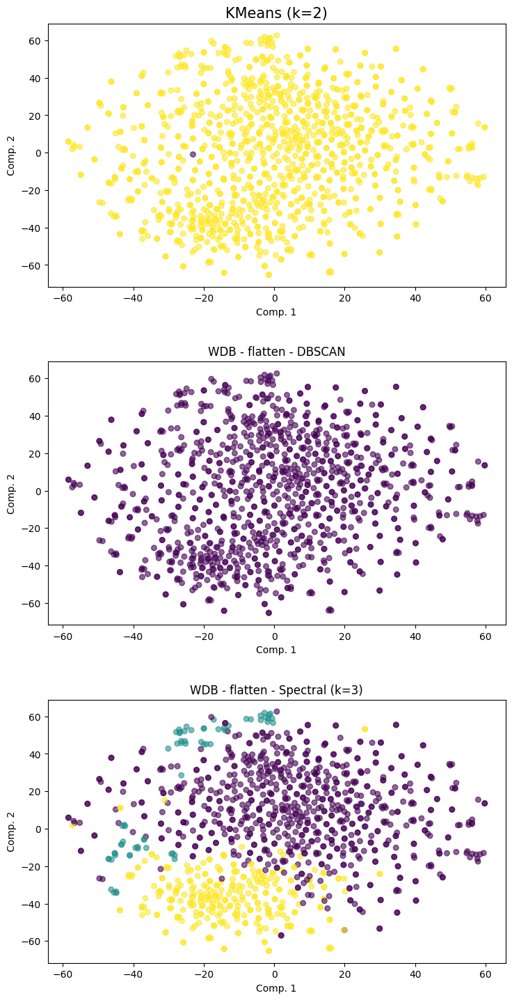

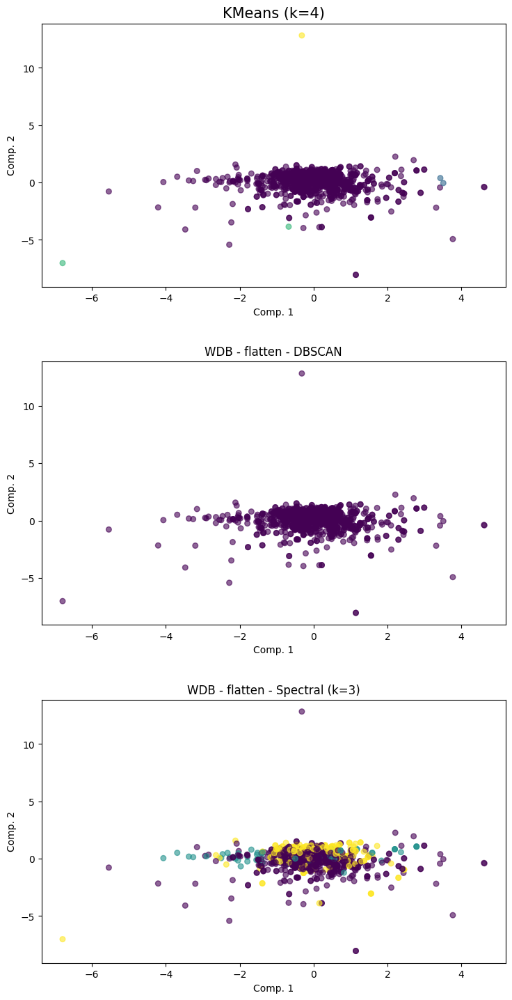

{'kmeans': array([0, 0, 0, ..., 0, 0, 0]),
 'dbscan': array([-1, -1, -1, ..., -1, -1, -1], dtype=int64),
 'spectral': array([0, 2, 0, ..., 0, 1, 0])}

In [ ]:
cluster_and_plot(
            repr_wdb_32["flatten"],
            "WDB",
            "flatten",
           dbscan_eps=1.5,
              kmeans_k=2,
            spectral_k=2,
           dbscan_min_samples=10,
            vis_method="tsne"
        )

cluster_and_plot(
            repr_wdb_32["flatten"],
            "WDB",
            "flatten",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="pca"
        )

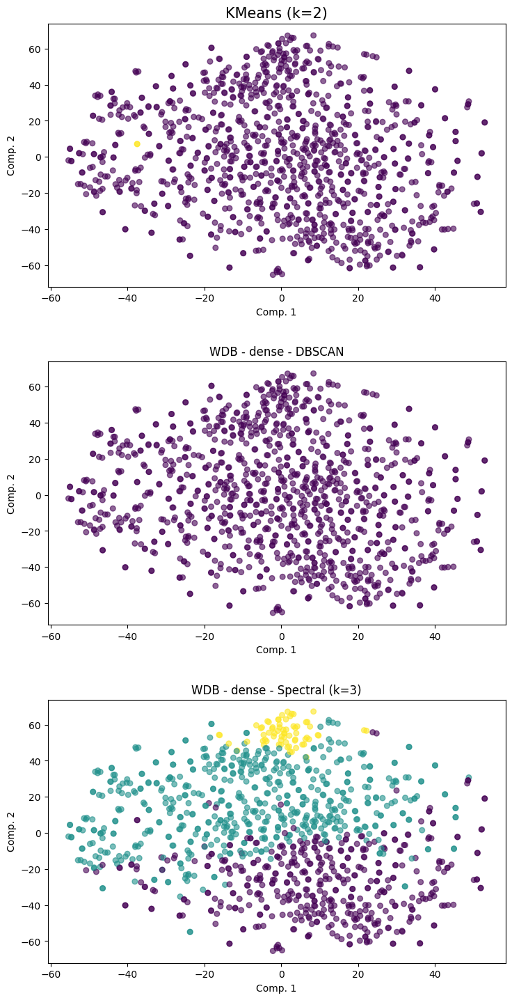

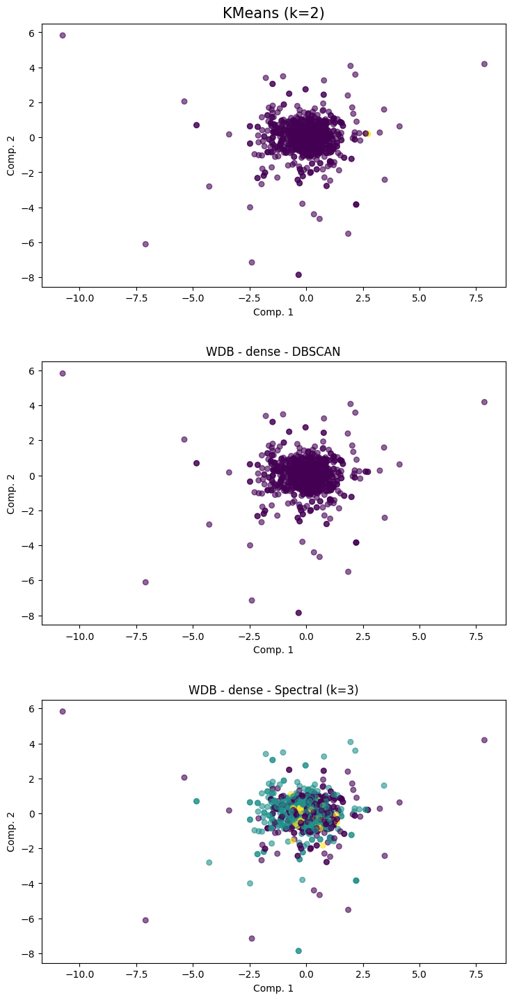

{'kmeans': array([0, 0, 0, ..., 0, 0, 0]),
 'dbscan': array([-1, -1, -1, ..., -1, -1, -1], dtype=int64),
 'spectral': array([0, 1, 1, ..., 1, 1, 1])}

In [ ]:
cluster_and_plot(
            repr_wdb_32["dense"],
            "WDB",
            "dense",
           dbscan_eps=1.5,
              kmeans_k=2,
            spectral_k=2,
           dbscan_min_samples=10,
            vis_method="tsne"
        )

cluster_and_plot(
            repr_wdb_32["dense"],
            "WDB",
            "dense",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="pca"
        )

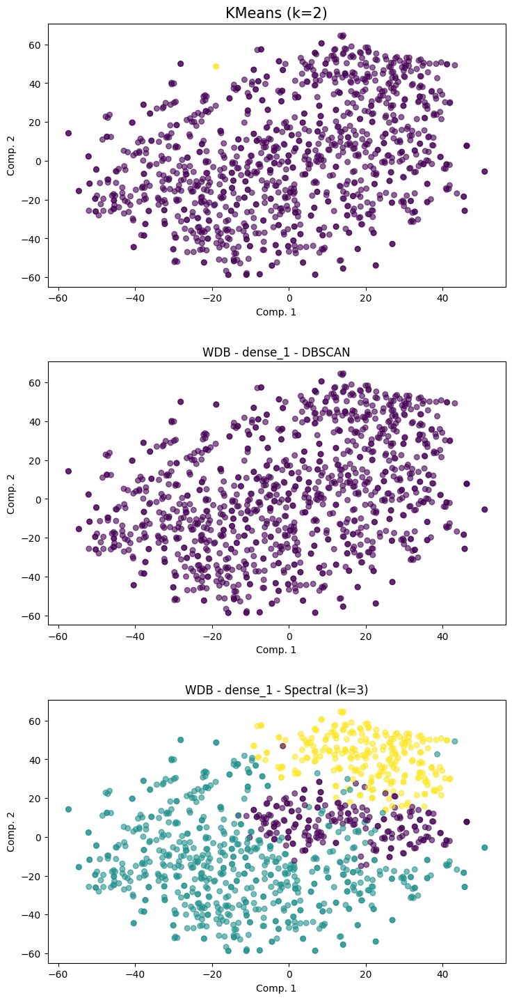

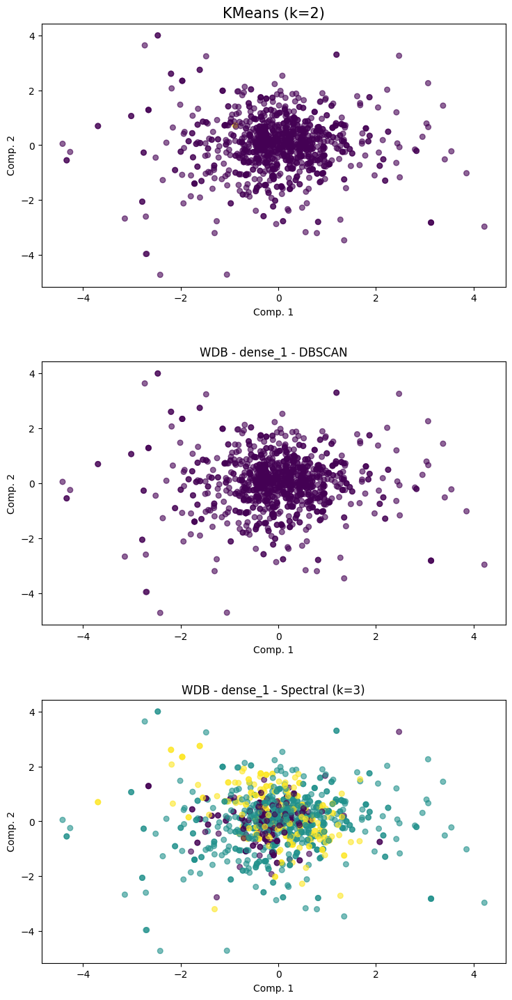

{'kmeans': array([0, 0, 0, ..., 0, 0, 0]),
 'dbscan': array([-1, -1, -1, ..., -1, -1, -1], dtype=int64),
 'spectral': array([1, 2, 0, ..., 0, 1, 1])}

In [ ]:
cluster_and_plot(
            repr_wdb_32["dense_1"],
            "WDB",
            "dense_1",
           dbscan_eps=1.5,
              kmeans_k=2,
            spectral_k=2,
           dbscan_min_samples=10,
            vis_method="tsne"
        )

cluster_and_plot(
            repr_wdb_32["dense_1"],
            "WDB",
            "dense_1",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="pca"
        )

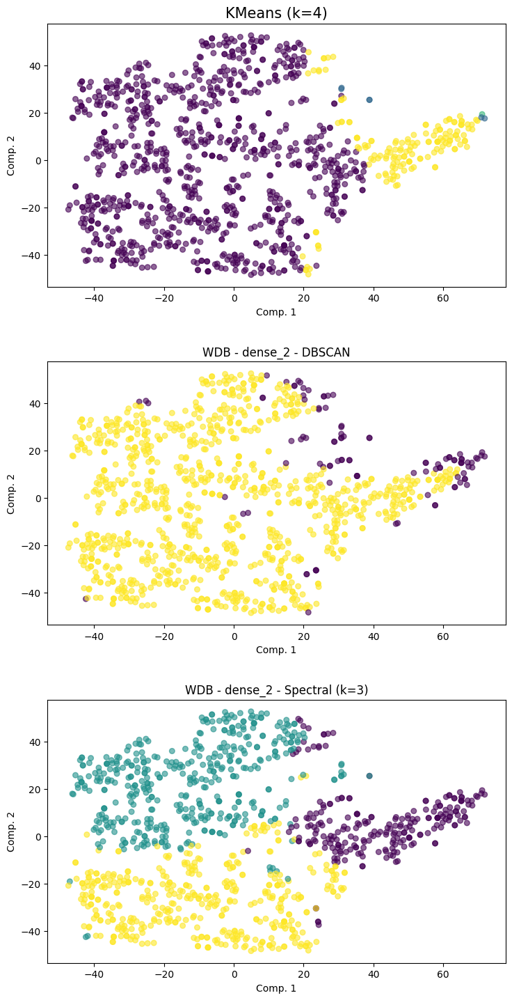

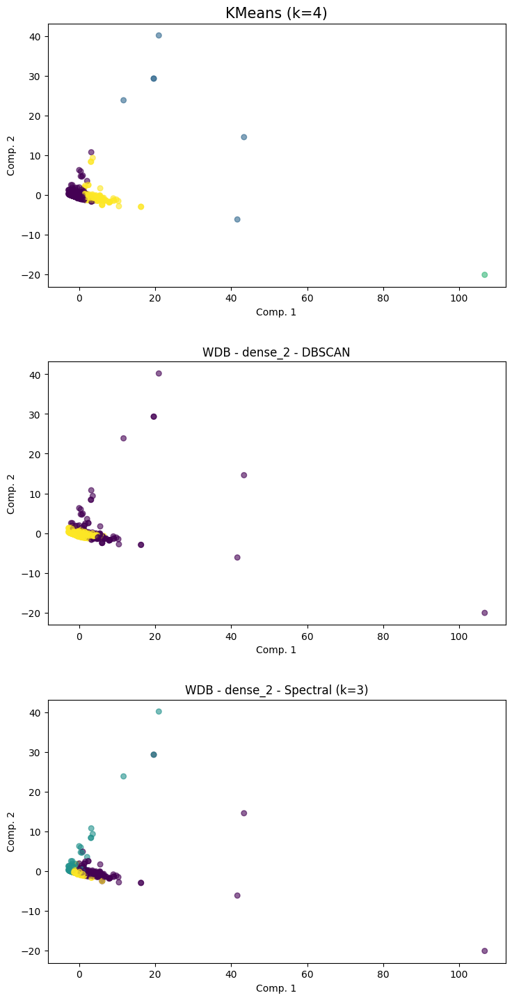

{'kmeans': array([0, 0, 0, ..., 0, 0, 0]),
 'dbscan': array([0, 0, 0, ..., 0, 0, 0], dtype=int64),
 'spectral': array([1, 2, 1, ..., 2, 2, 2])}

In [ ]:
cluster_and_plot(
            repr_wdb_32["dense_2"],
            "WDB",
            "dense_2",
           dbscan_eps=1.5,
              kmeans_k=2,
            spectral_k=2,
           dbscan_min_samples=10,
            vis_method="tsne"
        )

cluster_and_plot(
            repr_wdb_32["dense_2"],
            "WDB",
            "dense_2",
            kmeans_k=2,
            spectral_k=2,
            dbscan_eps=1.5,
            dbscan_min_samples=10,
            vis_method="pca"
        )

In [ ]:
# Guardar resultados
output_dir = os.path.join(project_dir, "notebooks", "latent_outputs")
os.makedirs(output_dir, exist_ok=True)

In [ ]:
# Guardar WDA
np.save(os.path.join(output_dir, "WDA_flatten_32.npy"), repr_wda_32["flatten"])
np.save(os.path.join(output_dir, "WDA_dense_32.npy"), repr_wda_32["dense"])
np.save(os.path.join(output_dir, "WDA_dense1_32.npy"), repr_wda_32["dense_1"])
np.save(os.path.join(output_dir, "WDA_dense2_32.npy"), repr_wda_32["dense_2"])

df_wda.to_csv(os.path.join(output_dir, "WDA_selected_spectra.csv"), index=False)

In [ ]:
# Guardar WDB
np.save(os.path.join(output_dir, "WDB_flatten_32.npy"), repr_wdb_32["flatten"])
np.save(os.path.join(output_dir, "WDB_dense_32.npy"), repr_wdb_32["dense"])
np.save(os.path.join(output_dir, "WDB_dense1_32.npy"), repr_wdb_32["dense_1"])
np.save(os.path.join(output_dir, "WDB_dense2_32.npy"), repr_wdb_32["dense_2"])

df_wdb.to_csv(os.path.join(output_dir, "WDB_selected_spectra.csv"), index=False)